# Import Libraries and Data Review

In [5]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt 
import seaborn as sns
import plotly.express as px

# classification models
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import PassiveAggressiveClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import AdaBoostClassifier
from xgboost import XGBClassifier # conda install -c conda-forge xgboost
from sklearn.ensemble import GradientBoostingClassifier

# regression models
from sklearn.dummy import DummyRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import BayesianRidge
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.tree import DecisionTreeRegressor
from xgboost import XGBRegressor

# clustering models
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import MeanShift, estimate_bandwidth

from sklearn import preprocessing 

#metrics
from sklearn import metrics
from sklearn.model_selection import cross_validate
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score, f1_score, precision_score,recall_score, jaccard_score,log_loss
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
from sklearn.metrics import silhouette_score, davies_bouldin_score

To ignore the warnings that may appear

In [7]:
import warnings
warnings.filterwarnings("ignore")

In [8]:
import os

for dirname, _, filenames in os.walk('.'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

.\Dataset Description.pdf
.\finalized_model.jlib
.\ML_Coursework_M33879.ipynb
.\ML_Coursework_M33879_Backup.ipynb
.\psyco.csv
.\research paper.pdf
.\sweetviz_report.html
.\UOP M33879 PDAA Coursework_T202406.docx
.\~$P M33879 PDAA Coursework_T202406.docx
.\.ipynb_checkpoints\ML_Coursework_M33879 - Copy-checkpoint.ipynb
.\.ipynb_checkpoints\ML_Coursework_M33879-checkpoint.ipynb
.\.ipynb_checkpoints\ML_Coursework_M33879_Backup-checkpoint.ipynb
.\.ipynb_checkpoints\pycho_report-checkpoint.html
.\.ipynb_checkpoints\research paper-checkpoint.pdf
.\.ipynb_checkpoints\solution-checkpoint.ipynb
.\tmp\df_000.png
.\tmp\df_001.png
.\tmp\df_002.png
.\tmp\df_003.png
.\tmp\df_004.png
.\tmp\df_005.png
.\tmp\df_006.png
.\tmp\df_007.png
.\tmp\df_008.png
.\tmp\df_009.png
.\tmp\df_010.png
.\tmp\df_011.png
.\tmp\df_012.png
.\tmp\df_013.png
.\tmp\df_014.png
.\tmp\df_015.png
.\tmp\df_016.png
.\tmp\df_017.png
.\tmp\df_018.png


# Loading the dataset using pandas

In [10]:
file_path = 'psyco.csv'
df0 = pd.read_csv(file_path)

df = df0.copy()

In [11]:
df.head(10)

,age,gender,occupation,line_of_work,time_bp,time_dp,travel_time,easeof_online,home_env,prod_inc,sleep_bal,new_skill,fam_connect,relaxed,self_time,like_hw,dislike_hw,prefer,certaindays_hw
0,19-25,Male,Student in College,NaN,7,5,0.5,3,3,0.0,0.0,0.5,1.0,-0.5,-0.5,100,1,Complete Physical Attendance,Yes
1,Dec-18,Male,Student in School,NaN,7,11,0.5,4,2,-0.5,0.5,-1.0,1.0,1.0,1.0,1111,1110,Complete Physical Attendance,No
2,19-25,Male,Student in College,NaN,7,7,1.5,2,2,1.0,0.0,0.5,0.5,0.5,0.5,1100,111,Complete Physical Attendance,Yes
3,19-25,Male,Student in College,NaN,7,7,1.5,3,1,0.0,1.0,0.5,0.0,-1.0,-0.5,100,1111,Complete Physical Attendance,Yes
4,19-25,Female,Student in College,NaN,7,7,1.5,2,2,0.0,0.0,0.0,0.0,0.5,0.0,1010,1000,Complete Physical Attendance,Yes
5,19-25,Male,Student in College,NaN,5,7,0.5,4,4,-1.0,-1.0,0.0,-0.5,0.0,0.0,110,1100,Complete Physical Attendance,No
6,19-25,Male,Student in College,NaN,5,4,0.5,1,3,0.5,0.5,1.0,0.5,1.0,1.0,1100,1101,Work/study from home,Yes
7,19-25,Male,Student in College,NaN,7,9,0.5,3,2,0.0,-0.5,-0.5,-1.0,-0.5,0.0,1000,1000,Complete Physical Attendance,Yes
8,19-25,Male,Student in College,NaN,5,9,0.5,1,2,1.0,1.0,1.0,1.0,1.0,1.0,1010,100,Work/study from home,Yes
9,19-25,Male,Student in College,NaN,7,7,1.5,2,2,0.0,0.0,0.0,-1.0,0.0,0.0,1110,1111,Work/study from home,Yes


In [12]:
df.tail()

,age,gender,occupation,line_of_work,time_bp,time_dp,travel_time,easeof_online,home_env,prod_inc,sleep_bal,new_skill,fam_connect,relaxed,self_time,like_hw,dislike_hw,prefer,certaindays_hw
1170,40-50,Female,Entrepreneur,NaN,9,9,0.5,2,1,0.5,-0.5,-0.5,0.5,0.0,0.0,10,1,Complete Physical Attendance,Yes
1171,26-32,Female,Homemaker,NaN,5,12,0.5,3,5,-0.5,-1.0,-0.5,0.0,-0.5,-0.5,100,111,Complete Physical Attendance,Maybe
1172,26-32,Male,Working Professional,Engineering,9,11,0.5,3,2,0.5,0.5,0.5,0.5,0.0,0.0,1111,110,Complete Physical Attendance,Maybe
1173,26-32,Male,Working Professional,Engineering,11,12,1.5,2,2,0.0,0.0,0.0,-1.0,0.0,-0.5,1111,1100,Complete Physical Attendance,Yes
1174,40-50,Male,Working Professional,Engineering,5,5,0.5,2,2,0.5,-0.5,0.5,0.5,0.5,0.5,1100,101,Work/study from home,Yes


# Exploratory Data Analysis (EDA)

In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1175 entries, 0 to 1174
Data columns (total 19 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             1175 non-null   object 
 1   gender          1175 non-null   object 
 2   occupation      1175 non-null   object 
 3   line_of_work    479 non-null    object 
 4   time_bp         1175 non-null   int64  
 5   time_dp         1175 non-null   int64  
 6   travel_time     1175 non-null   float64
 7   easeof_online   1175 non-null   int64  
 8   home_env        1175 non-null   int64  
 9   prod_inc        1175 non-null   float64
 10  sleep_bal       1175 non-null   float64
 11  new_skill       1175 non-null   float64
 12  fam_connect     1175 non-null   float64
 13  relaxed         1175 non-null   float64
 14  self_time       1175 non-null   float64
 15  like_hw         1175 non-null   int64  
 16  dislike_hw      1175 non-null   int64  
 17  prefer          1175 non-null   o

In [15]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
time_bp,1175.0,7.415319,2.005385,4.0,5.0,7.0,9.0,12.0
time_dp,1175.0,7.971915,2.657007,4.0,5.0,9.0,9.0,12.0
travel_time,1175.0,1.027660,0.713314,0.5,0.5,0.5,1.5,3.0
easeof_online,1175.0,2.533617,1.267609,1.0,1.0,2.0,4.0,5.0
home_env,1175.0,2.752340,1.235799,1.0,2.0,3.0,4.0,5.0
prod_inc,1175.0,0.008936,0.615083,-1.0,-0.5,0.0,0.5,1.0
sleep_bal,1175.0,-0.108936,0.621215,-1.0,-0.5,0.0,0.5,1.0
new_skill,1175.0,0.146809,0.643686,-1.0,-0.5,0.5,0.5,1.0
fam_connect,1175.0,0.260426,0.686825,-1.0,0.0,0.5,1.0,1.0
relaxed,1175.0,0.035745,0.626637,-1.0,-0.5,0.0,0.5,1.0


In [16]:
df.describe(include="object").T

,count,unique,top,freq
age,1175,7,19-25,345
gender,1175,3,Male,649
occupation,1175,8,Working Professional,479
line_of_work,479,8,Teaching,217
prefer,1175,2,Complete Physical Attendance,836
certaindays_hw,1175,3,Yes,568


In [17]:
# Dimension of the data
df.shape

(1175, 19)

In [18]:
df.select_dtypes(include='object').nunique()

age               7
gender            3
occupation        8
line_of_work      8
prefer            2
certaindays_hw    3
dtype: int64

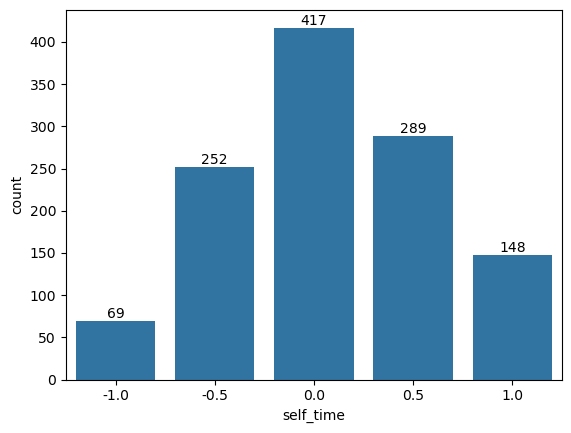

In [19]:
ax = sns.countplot(x="self_time", data=df)
ax.bar_label(ax.containers[0]);

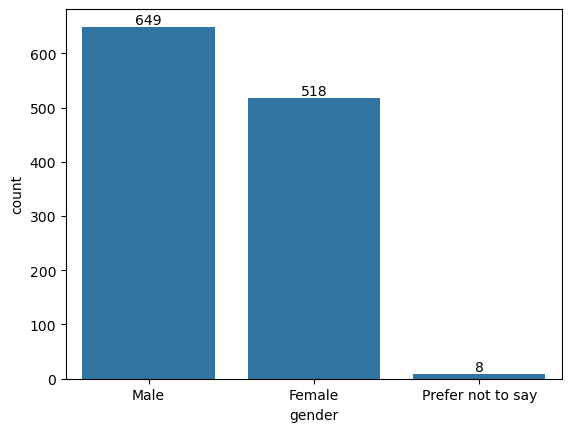

In [20]:
ax = sns.countplot(x="gender", data=df)
ax.bar_label(ax.containers[0]);

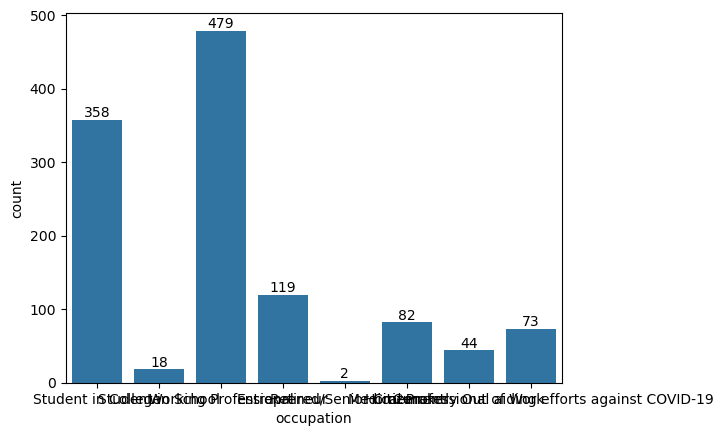

In [21]:
ax = sns.countplot(x="occupation", data=df)
ax.bar_label(ax.containers[0]);

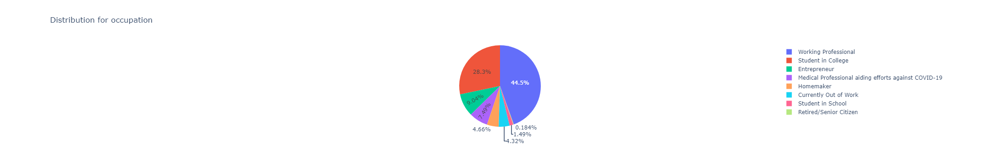

In [22]:
fig = px.pie(df, values='time_bp', names='occupation', title='Distribution for occupation', hover_data=['prefer'])
fig.show()

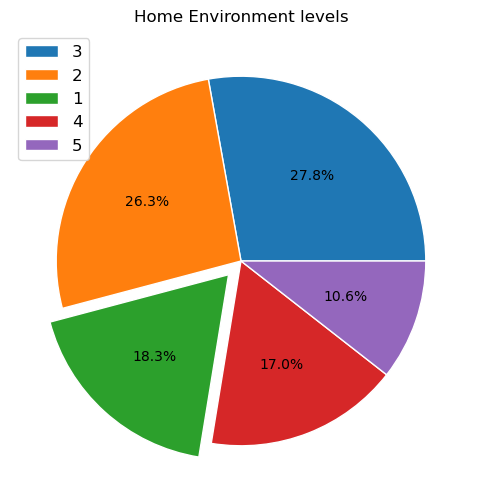

In [23]:
# Ease of Online Working
plt.figure(figsize=(6, 6))
explode = (0,0,0.1,0,0)  # only "explode" the Electronic check
plt.pie(df['home_env'].value_counts(), explode=explode,labeldistance=1.15,wedgeprops = { 'linewidth' : 1, 'edgecolor' : 'white' },autopct='%1.1f%%')
plt.legend(df['home_env'].value_counts().index, loc='best', fontsize=12)
plt.title('Home Environment levels')
plt.show()

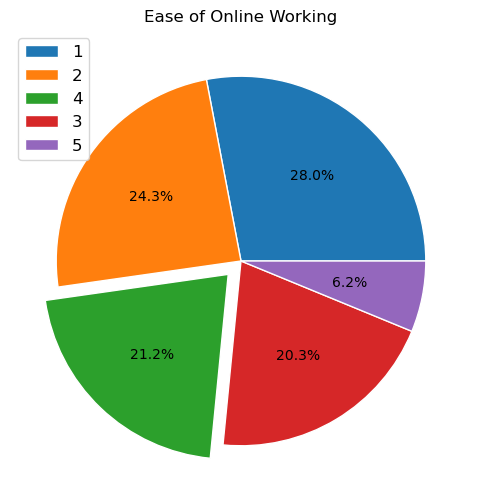

In [24]:
# Preference for Attendance Mode – Physical/Homer'
plt.figure(figsize=(6, 6))
explode = (0,0,0.1,0,0)  # only "explode" the Electronic check
plt.pie(df['easeof_online'].value_counts(), explode=explode,labeldistance=1.15,wedgeprops = { 'linewidth' : 1, 'edgecolor' : 'white' },autopct='%1.1f%%')
plt.legend(df['easeof_online'].value_counts().index, loc='best', fontsize=12)
plt.title('Ease of Online Working')
plt.show()

# Numerical data distribution : Univariate histograms (analysis of 1 variable).

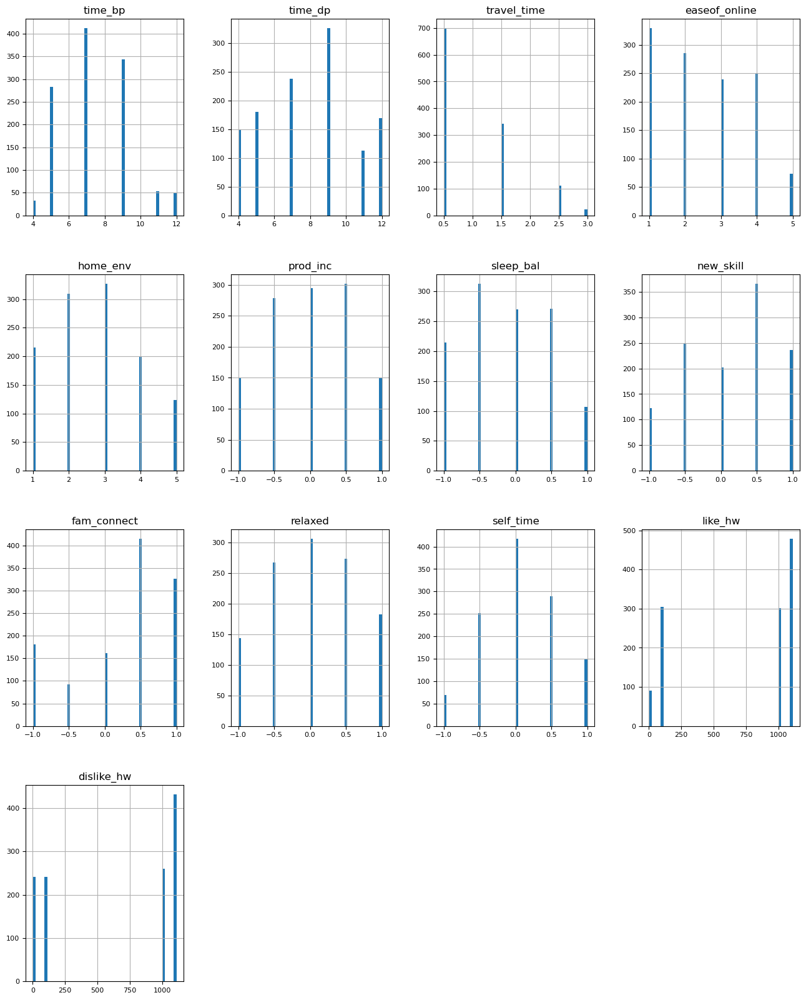

In [26]:
df_numerical = df.select_dtypes(include = ['float64', 'int64'])
df_numerical.head()
df_numerical.hist(figsize=(16, 20), bins=50, xlabelsize=8, ylabelsize=8);
plt.show()

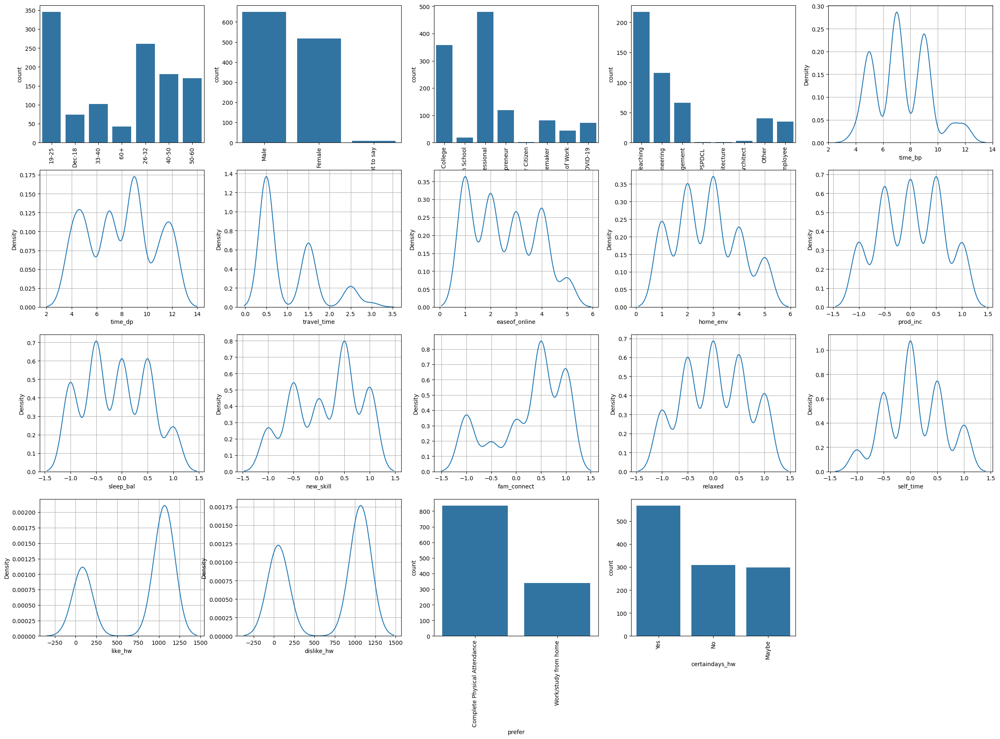

In [27]:
plt.rcParams['figure.figsize']=[30,20]
import warnings
warnings.filterwarnings("ignore")

r=4
c=5
it=1
for i in df.columns:
    plt.subplot(r,c,it)
    if df[i].dtype=='object':
        sns.countplot(x=df[i])
        plt.xticks(rotation=90)
    else:
        sns.kdeplot(df[i])
        plt.grid()
    it+=1
plt.show()

Visualizing pairwise relationships in a dataset¶

<Figure size 2500x2000 with 0 Axes>

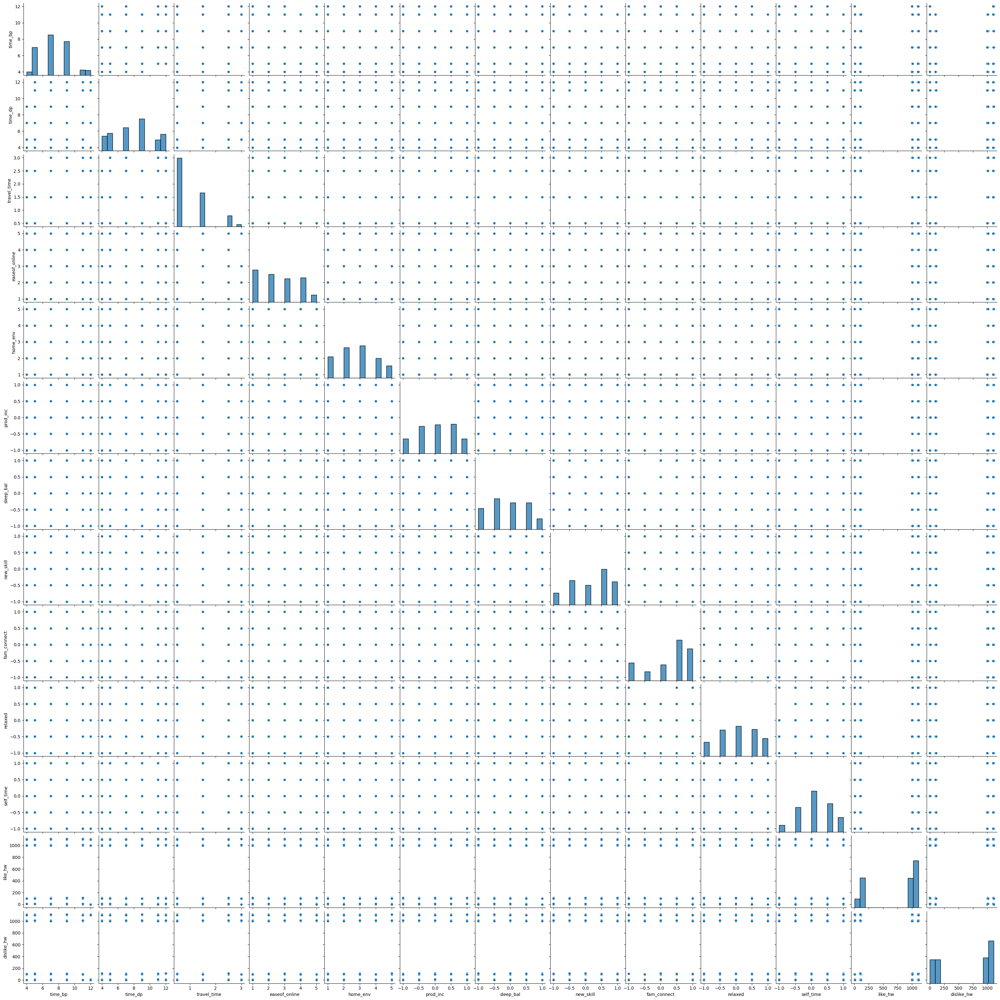

In [29]:
plt.figure(figsize=(25, 20))
sns.pairplot(df);
plt.show()

<Figure size 2500x2000 with 0 Axes>

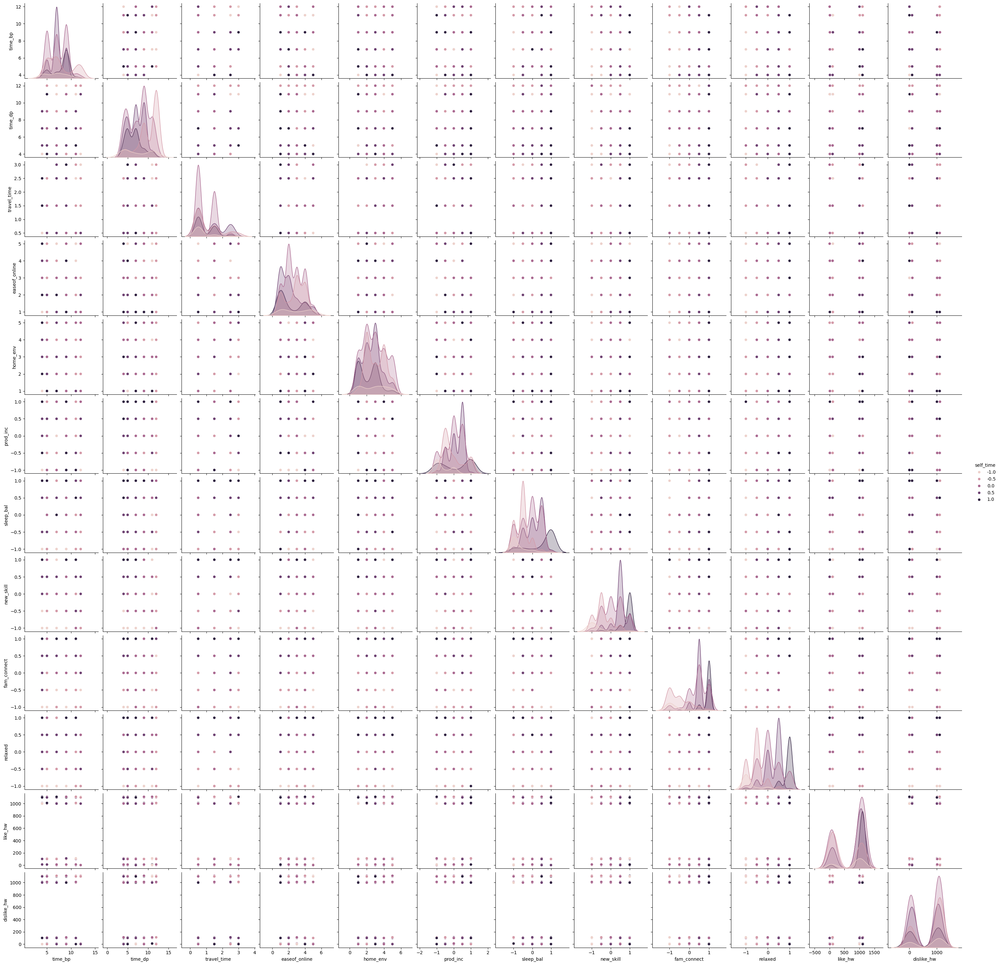

In [30]:
plt.figure(figsize=(25, 20))
sns.pairplot(df,hue='self_time');
plt.show()

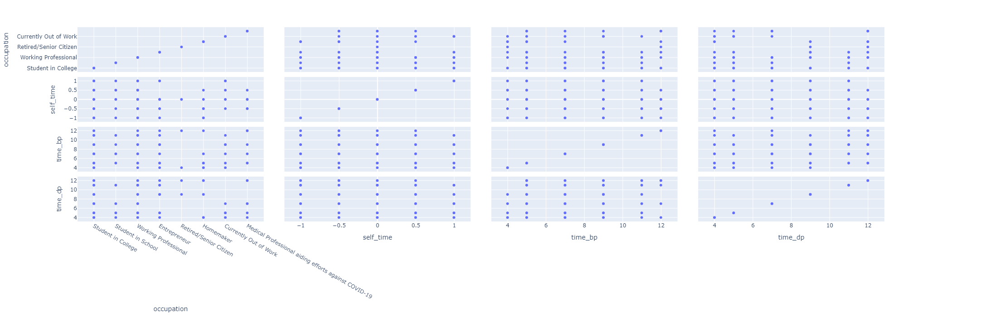

In [31]:
# Plotly offer same pairplot option with scatter_matrix but with nteractivity
fig = px.scatter_matrix(df, dimensions=df[[ 'occupation','self_time','time_bp', 'time_dp']],width=700, height=700)
fig.show()

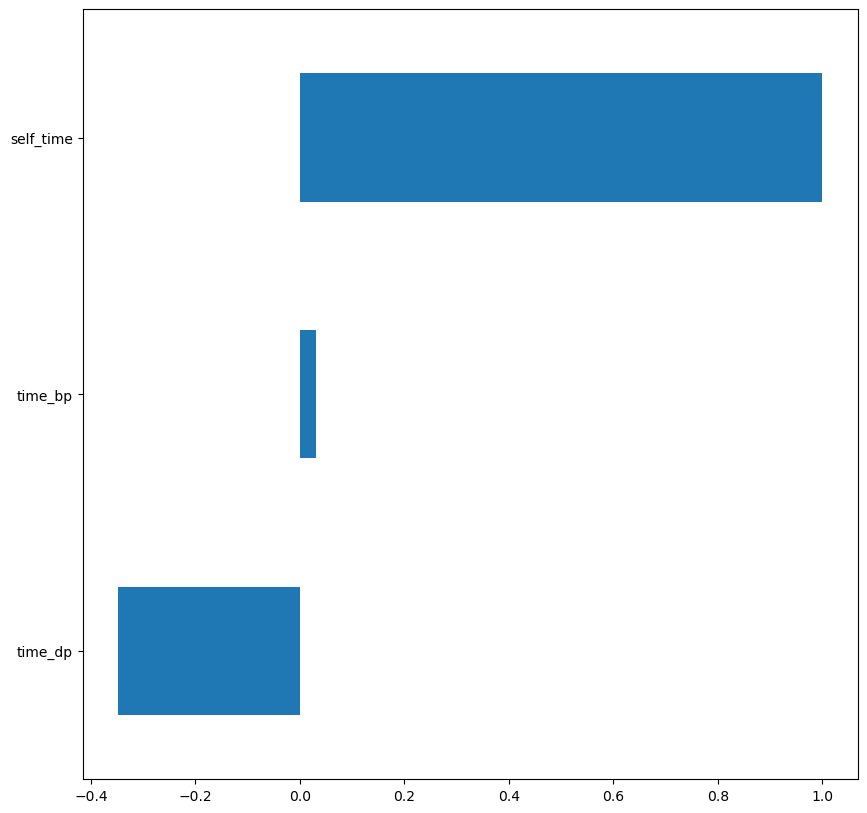

In [32]:
plt.figure(figsize=(10, 10))
time_dep = df[['time_bp', 'time_dp', 'self_time']]
time_dep.corr()['self_time'].sort_values().plot(kind='barh');

# Multiple Variable Analysis

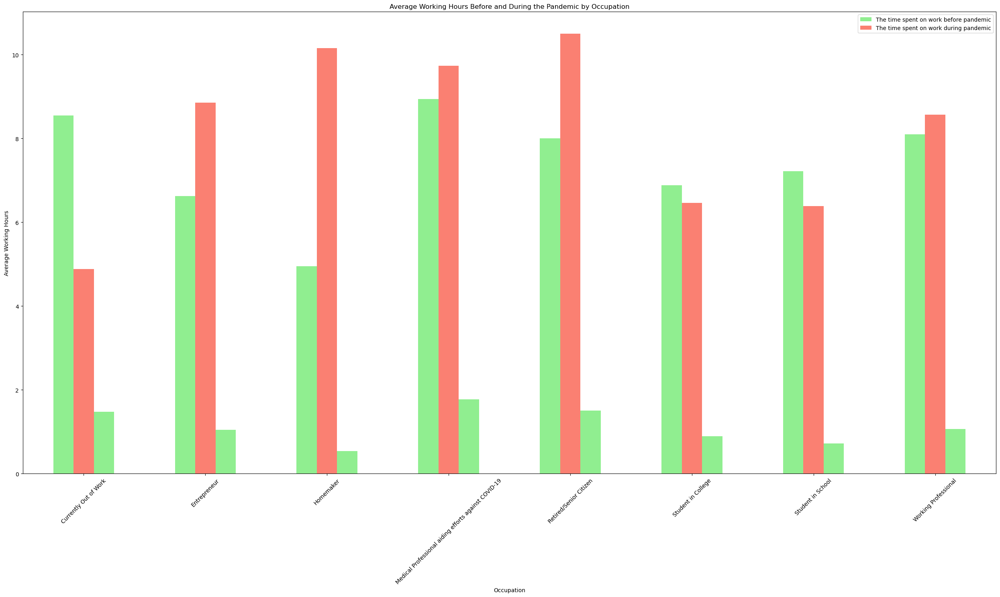

In [34]:
#mul_df = df[['occupation', 'time_bp', 'time_dp','travel_time','prod_inc','sleep_bal','new_skill','fam_connect','relaxed','self_time']]
mul_df = df[['occupation', 'time_bp', 'time_dp','travel_time']]
mul_df = mul_df.groupby('occupation').mean()
mul_df.plot(kind='bar', figsize=(25, 15), color=['lightgreen','salmon'])
plt.xlabel('Occupation')
plt.ylabel('Average Working Hours')
plt.title('Average Working Hours Before and During the Pandemic by Occupation')
plt.xticks(rotation= 45)
plt.legend(['The time spent on work before pandemic','The time spent on work during pandemic'])
plt.tight_layout()
plt.show()

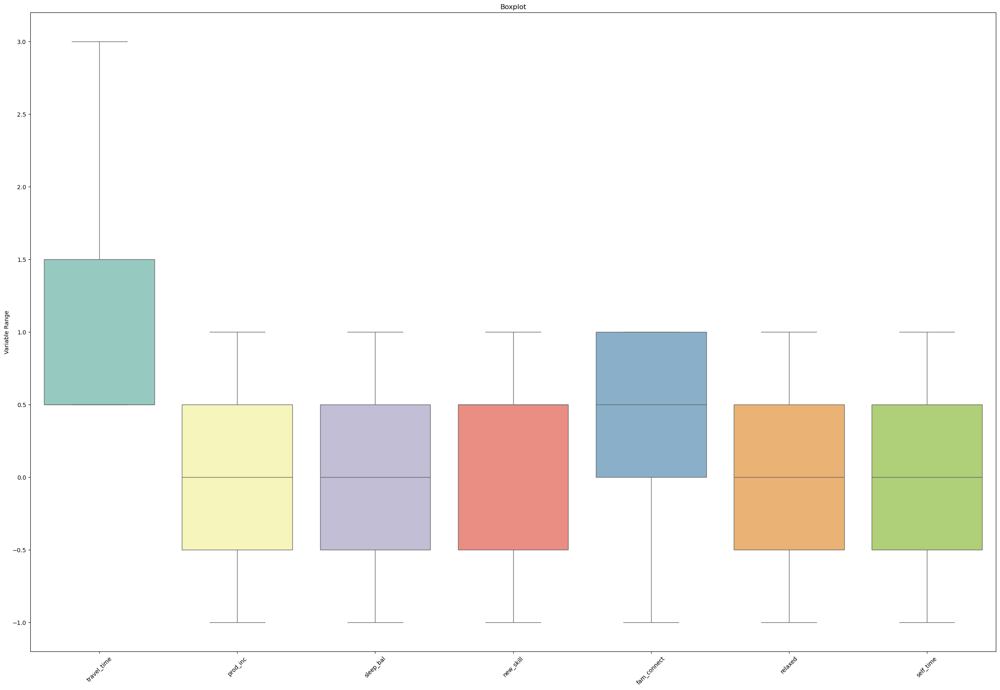

In [35]:
columns_num = ["travel_time","prod_inc","sleep_bal","new_skill","fam_connect","relaxed","self_time"]
#columns_num = ['occupation', 'time_bp', 'time_dp','travel_time','prod_inc','sleep_bal','new_skill','fam_connect','relaxed','self_time']
sns.boxplot(df.loc[:, columns_num], orient = "v", palette = "Set3")
plt.ylabel('Variable Range')
plt.title('Boxplot')
plt.xticks(rotation= 45)
plt.show()

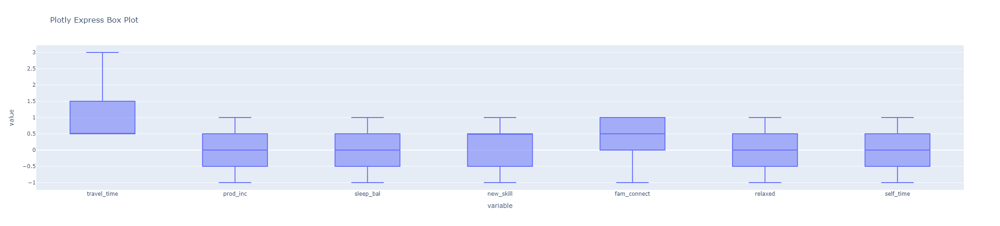

In [36]:
# Plotly Express Box Plot
columns_num = ["travel_time","prod_inc","sleep_bal","new_skill","fam_connect","relaxed","self_time"]
#columns_num = ['occupation', 'time_bp', 'time_dp','travel_time','prod_inc','sleep_bal','new_skill','fam_connect','relaxed','self_time']
fig = px.box(df.loc[:, columns_num], width=1500, height=500,title='Plotly Express Box Plot')
fig.show()

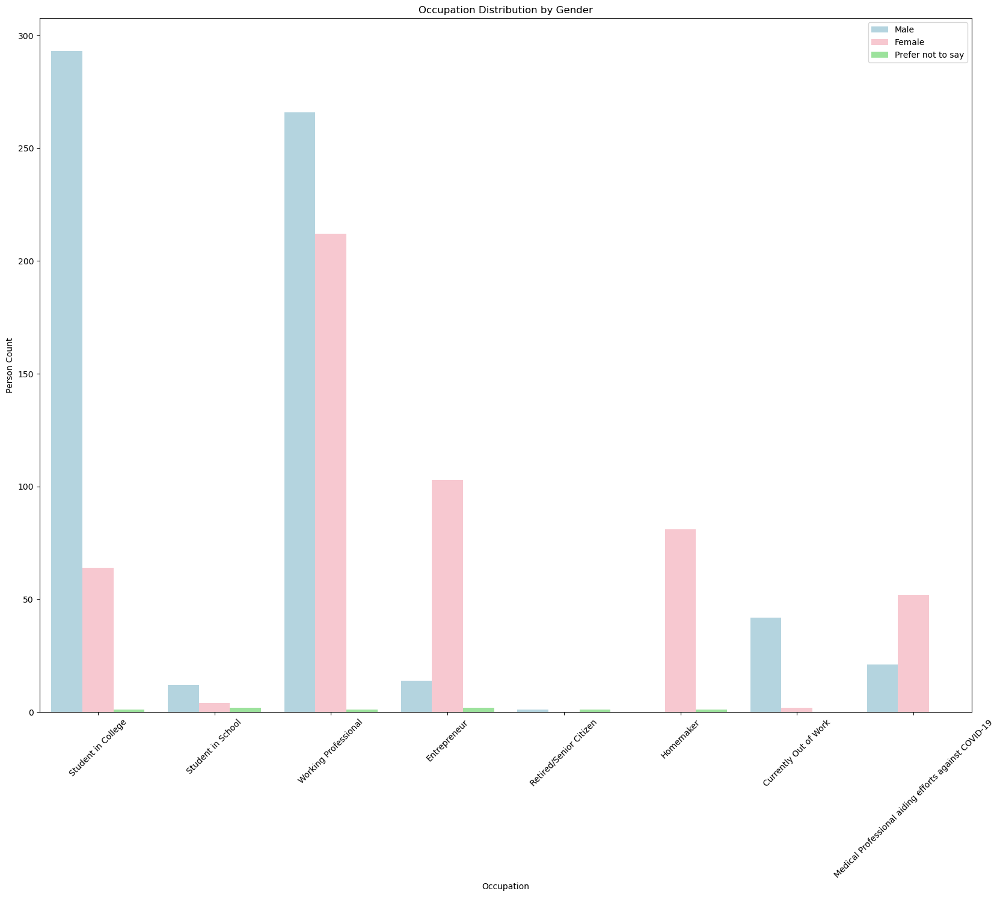

In [37]:
fig= plt.subplots(figsize=(20, 15))
sns.countplot(x='occupation', hue='gender', data=df, palette=['lightblue', 'pink','lightgreen'])
plt.title('Occupation Distribution by Gender')
plt.xlabel('Occupation')
plt.ylabel('Person Count')
plt.legend(['Male', 'Female','Prefer not to say'])
plt.xticks(rotation= 45)
plt.show()

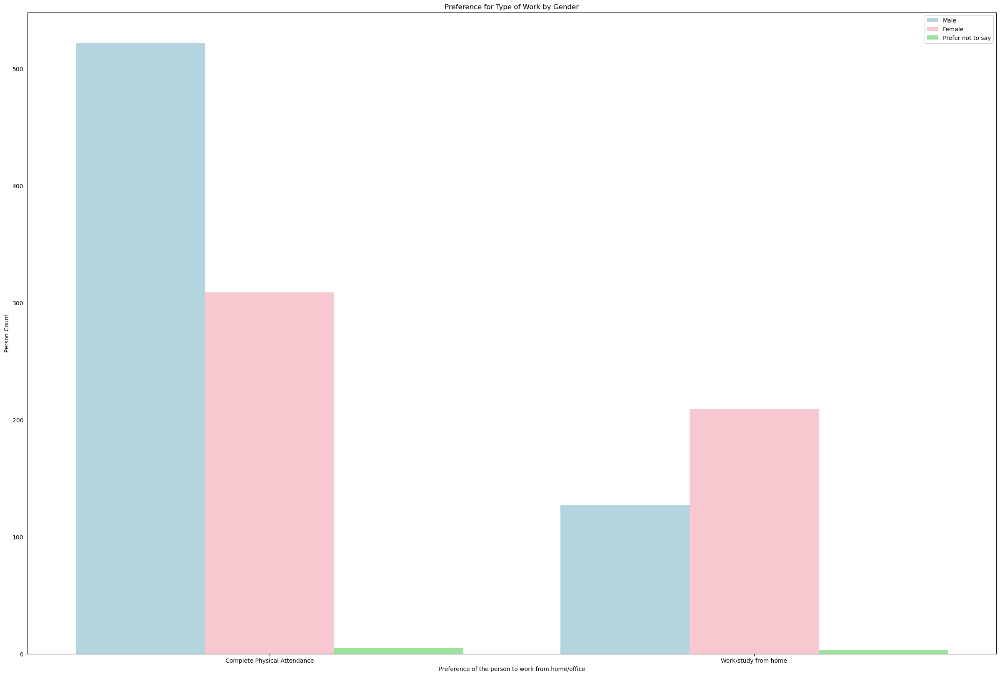

In [38]:
sns.countplot(x='prefer', hue='gender', data=df, palette=['lightblue', 'pink','lightgreen'])
plt.title('Preference for Type of Work by Gender')
plt.xlabel('Preference of the person to work from home/office')
plt.ylabel('Person Count')
plt.legend(['Male', 'Female','Prefer not to say'])
plt.show()

# Bivariate(Two Feature) correlation matrix

In [40]:
#+1 indicates a perfect positive linear relationship,
#-1 indicates a perfect negative linear relationship,
#0 indicates no linear relationship.
df_original_corr = df[['time_bp','time_dp','travel_time','easeof_online','home_env','prod_inc','like_hw','dislike_hw','self_time']]
corr = df_original_corr.corr(method='pearson') # other method = Spearman , Kendall 
corr.style.background_gradient(cmap='coolwarm')

,time_bp,time_dp,travel_time,easeof_online,home_env,prod_inc,like_hw,dislike_hw,self_time
time_bp,1.000000,0.355643,0.299816,0.071906,0.006138,-0.071031,0.207231,0.185482,0.029816
time_dp,0.355643,1.000000,0.118609,-0.080775,0.032382,0.295935,-0.069568,0.004119,-0.348604
travel_time,0.299816,0.118609,1.000000,0.146163,-0.002368,-0.145684,0.149737,-0.061845,0.050292
easeof_online,0.071906,-0.080775,0.146163,1.000000,0.510191,-0.641397,-0.196326,0.170586,-0.212880
home_env,0.006138,0.032382,-0.002368,0.510191,1.000000,-0.365763,-0.117974,0.303580,-0.190767
prod_inc,-0.071031,0.295935,-0.145684,-0.641397,-0.365763,1.000000,0.099451,-0.092169,0.228605
like_hw,0.207231,-0.069568,0.149737,-0.196326,-0.117974,0.099451,1.000000,0.182292,0.280357
dislike_hw,0.185482,0.004119,-0.061845,0.170586,0.303580,-0.092169,0.182292,1.000000,-0.114964
self_time,0.029816,-0.348604,0.050292,-0.212880,-0.190767,0.228605,0.280357,-0.114964,1.000000


Text(0.5, 1.0, 'Correlation Matrix !!')

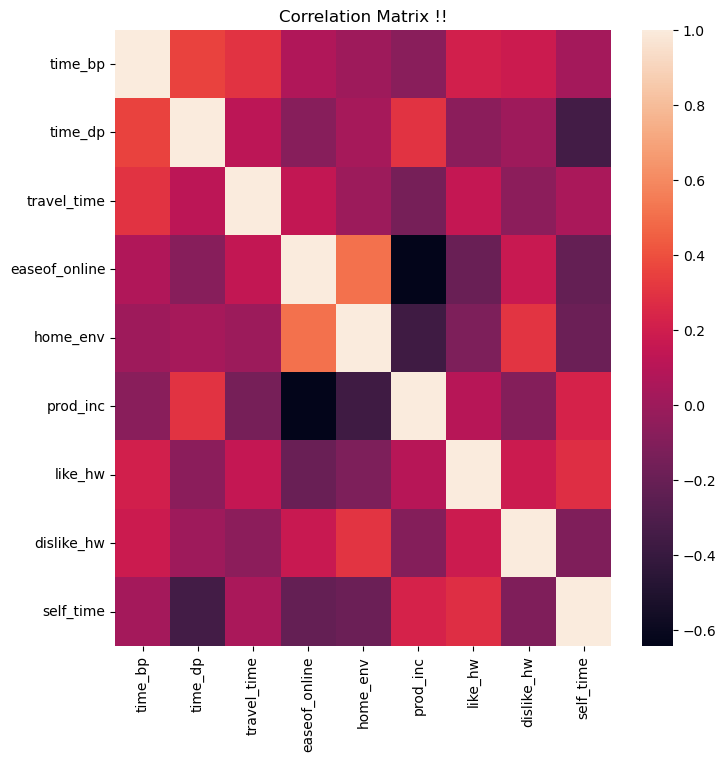

In [41]:
plt.figure(figsize=(8,8))
sns.heatmap(corr)
plt.title("Correlation Matrix !!")

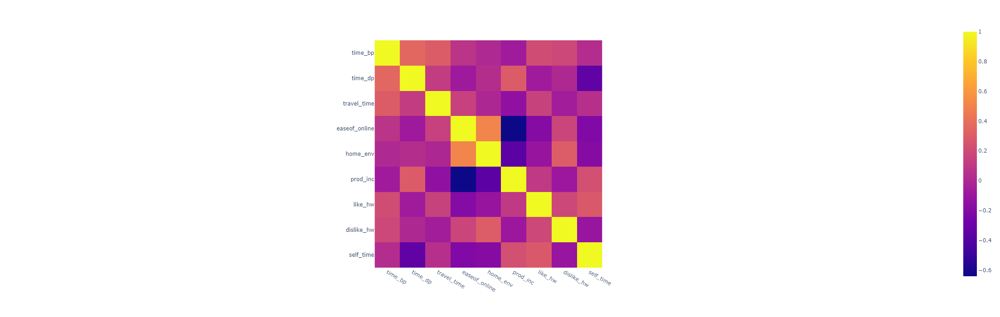

In [42]:
# HeatMap - https://plotly.com/python/imshow/
fig = px.imshow(corr,x=list(corr.columns),y=list(corr.columns),width=700, height=700)
fig.show()

,time_bp,time_dp,travel_time,easeof_online,home_env,prod_inc,like_hw,dislike_hw,self_time
time_bp,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
time_dp,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
travel_time,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
easeof_online,NaN,NaN,NaN,NaN,NaN,-0.641397,NaN,NaN,NaN
home_env,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
prod_inc,NaN,NaN,NaN,-0.641397,NaN,NaN,NaN,NaN,NaN
like_hw,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
dislike_hw,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
self_time,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


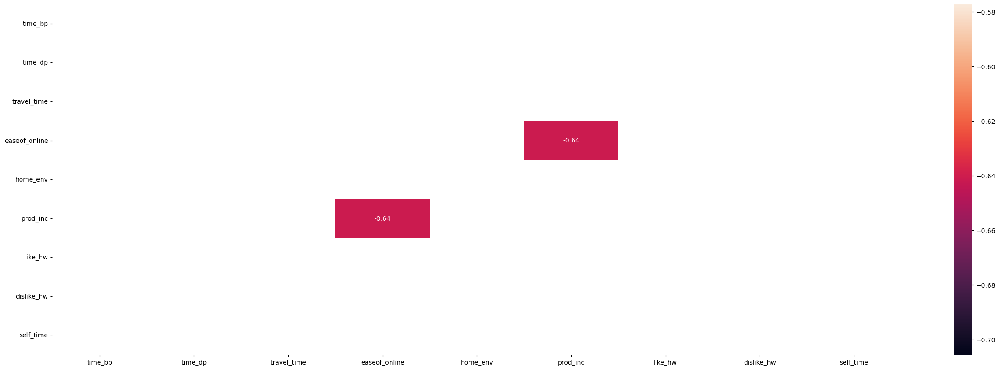

In [43]:
filteredDf = corr[((corr > 0.6) | (corr < -0.6)) & (corr !=1.000)]
display(filteredDf)

plt.figure(figsize=(30,10))
sns.heatmap(filteredDf, annot=True)
plt.show()

# Features Summary

In [45]:
!pip install summarytools
from summarytools import dfSummary

dfSummary(df)

No,Variable,Stats / Values,Freqs / (% of Valid),Graph,Missing
1,age[object],1. 19-252. 26-323. 40-504. 50-605. 33-406. Dec-187. 60+,345 (29.4%)261 (22.2%)181 (15.4%)170 (14.5%)102 (8.7%)74 (6.3%)42 (3.6%),"<img src = ""data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAAJsAAAChCAYAAADQgM1HAAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjguNCwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy8fJSN1AAAACXBIWXMAAA9hAAAPYQGoP6dpAAAC+klEQVR4nO3bQWobWQBF0a9GhM5Ewhi8GC+iF9uL0G6MsQadkIl6EAJJcIKqrLolOedsQH9w+aKKepvT6TSg8NfaB+DPITYyYiMjNjJiI7MZY3wcY3xY+yAzfDmdTp/WPgTn297f3/+z2+3u1j7IVMfj8Xmz2fwruNux3e12d4+Pj5/2+/3ntQ9zrpeXl78Ph8Pd09PThzGG2G7Edowx9vv954eHh//WPsxEH9c+ANN4QCAjNjJiIyM2MmIjIzYyYiMjNjJiIyM2MmIjIzYyYiOzHePrJztrH2SKWzsvX22Px+Pz4XC4Gzf2yc7xeHweY3xZ+xycz2fhZDYW8VSu6WZzU71zVzN4MWB5/65i8GLA8me4psHLTT0NM52XumTERkZsZMRGRmxkxEZGbGTERkZsZMRGRmxkxEZGbGTERuYq1lVr/z6Nq1lXWUu9fzYIZKyryBQ3mxuLMUawrrKa4ptF11VWU3yvWFdZTTHG8FKXkNjIiI2M2MiIjYzYyIiNjNjIiI2M2MiIjYzYyIiNzKKDF0MWvrf44MWQhW98Fk7G4IWMBwQyS/6N+vvkB4utq6yq+Nki6yqrKl6z5LrKqoofeEAgIzYyYiMjNjJiIyM2MmIjIzYyYiMjNjJiIyM2MmIjs8i6yqqK1yy2rrKq4mc+CydjXUVm7s3m1mKyWYMXYxbmmDx4MWZhrrmDF2MWJvNSl4zYyIiNjNjIiI2M2MiIjYzYyIiNjNjIiI2M2MiIjczkwYsxC3PNGrwYszCHz8LJGLyQ8YBAZsrfqL9O3uTsdZVFFW911rrKoopLmLKusqjiTTwgkBEbGbGRERsZsZERGxmxkREbGbGRERsZsZERGxmxkTlrXWVRxSWcva6yqOKtfBZOxrqKzO9uNjcZF/XLwYuBC5f26uDFwIUl/G7wYuDCRXmpS0ZsZMRGRmxkxEZGbGTERkZsZMRGRmxkxEZGbGTERkZsZF5dV1lTsYRfrqusqbg0GwQy1lVkPCCQERsZsZERG5n/AVBveRV74L2mAAAAAElFTkSuQmCC"">",0(0.0%)
2,gender[object],1. Male2. Female3. Prefer not to say,649 (55.2%)518 (44.1%)8 (0.7%),"<img src = ""data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAAJsAAABFCAYAAABdVZTTAAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjguNCwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy8fJSN1AAAACXBIWXMAAA9hAAAPYQGoP6dpAAABmUlEQVR4nO3bQWricBjG4S8llOkmQQIexkP0sHOI3EbELNrSTWYxDlN0lvN/I/Z5TvAhP9SIb7eua0HC09YH8H10VfVSVc9bH/KAPtd1fd/6iHvST9P0OgzDbutDHs2yLKeu634K7q9+GIbd4XB4H8fxY+tjHsX5fP4xz/PueDw+V5XYLvqqqnEcP/b7/dvWxzyYl60PuDceEIgRGzFiI0ZsxIiNGLERIzZixEaM2IgRGzFiI0ZsxIiNGLER01f9/v/V1oc8Eq/nv/XLspzmed6V/1/9V8uynKrqc+s77okNQjs2CFc6Uz5SvLPd8o7UiHXVFauodqyrvrCKasu66pan8kb8qEuM2IgRGzFiI0ZsxIiNGLERIzZixEaM2IgRGzFiI0ZsxIiNGOuqL7wObVlXXbGKascG4ZYNQiPWVcR4QCDmz8do+eigtX6apteqKvM1WnsahmF32Y16SKAp39mIERsxYiNGbMSIjRixESM2YsRGjNiIERsxYiNGbMSIjRixESM2YsRGTH+ZrlWZr9GYDQIxpnzE/AIQ0oNsj3jX1QAAAABJRU5ErkJggg=="">",0(0.0%)
3,occupation[object],1. Working Professional2. Student in College3. Entrepreneur4. Homemaker5. Medical Professional aiding ef6. Currently Out of Work7. Student in School8. Retired/Senior Citizen,479 (40.8%)358 (30.5%)119 (10.1%)82 (7.0%)73 (6.2%)44 (3.7%)18 (1.5%)2 (0.2%),"<img src = ""data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAAJsAAAC4CAYAAAD0WZ4UAAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjguNCwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy8fJSN1AAAACXBIWXMAAA9hAAAPYQGoP6dpAAADbklEQVR4nO3dwU3bcBjG4c9RRJuLowiJEdobAzBEh+0QGYBjd0ARPjSUS3poVfUAyMbxa5k8zwR/pJ9s2fIbmtPpVJCwmvsAXA6xESM2YsRGjNiIERsxTVVtqupq7oPM5Pl0Oh3nPsSlWF9fX39r23Y390Hm0HXdoWma74LLWLdtu7u7uztut9unuQ+T9Pj4+Hm/3+8eHh6uqkpsAeuqqu12+3Rzc/Nz7sPMYDP3AS6JBwRixEaM2IgRGzFiI0ZsxIiNGLERIzZixEaM2IgRGzFiI2Zd9edzm7kPknaJf/Pc1l3XHfb7/a4u8HObrusOVfU89zkuhc/CfaUb0/j5BVKWfmVzZVqQRQ9eDFaWZbGDF4OV5Vn64OXinqCXzEtdYsRGjNiIERsxYiNGbMSIjRixESM2YsRGjNiIERsxYiNmsYOXJZ750i168GKwsiw+CyfG4IUYDwjEnOM26lZGL6PXVRZO9DVqXWXhxBDnWFct7pUJ8/CAQIzYiBEbMWIjRmzEiI0YsREjNmLERozYiBEbMWIjRmzEjFpXWTgxxOh1lYUTffksnBjrKmKGXtlcxXi3QYMX4xbG6D14MW5hrKGDF+MW3s1LXWLERozYiBEbMWIjRmzEiI0YsREjNmLERozYiBEbMWIjpvfgxbiFsQYNXoxbGMNn4cQYvBDjAYGYIbdRt1BG6b2usqxirF7rKssqzmHIusqyilE8IBAjNmLERozYiBEbMWIjRmzEiI0YsREjNmLERozYiBEbMb3WVZZVnEPvdZVlFWP5LJwY6ypi3rqyuZJxVq8OXgxcOLcXBy8GLkzhrcGLgQtn5aUuMWIjRmzEiI0YsREjNmLERozYiBEbMWIjRmzEiI0YsREjNmJeXFdZUzGFV9dV1lScmw0CMdZVxPx/ZXMlY1L/1lXWVExt1bbt7vb2tv7O+fr+31EYbFVVtdlsfs19ED4+L3WJERsxYiNGbMSIjRixESM2YsRGjNiIERsxYiNGbMSIjZhVVdXxePw090H4+FZd1x3u7+8NXJicz8KJMXghxgMCMaumab42TWMBz+RWVfWlqjyNMjm3UWLERozYiBEbMWIjRmzEiI0YsREjNmLERozYiBEbMWIjRmzEiI0YsRGzqqofVeUHnJmcwQsxbqPEiI0YsREjNmLERozYiPkNhP5v

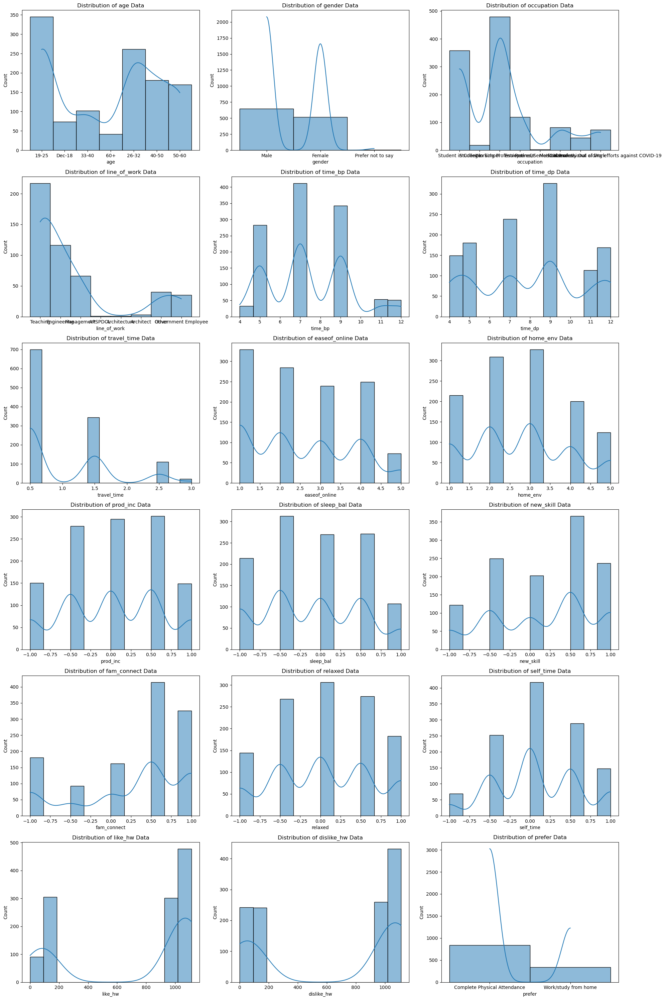

In [46]:
import math
num_cols = df.iloc[:, :-1].shape[1]
num_rows = math.ceil(num_cols / 3)
plt.figure(figsize=(20, 5 * num_rows))
for i, col in enumerate(df.iloc[:, :-1].columns, 1):
 plt.subplot(num_rows, 3, i)
 plt.title(f"Distribution of {col} Data")
 sns.histplot(df[col], kde=True)
 plt.tight_layout()
    
plt.show()

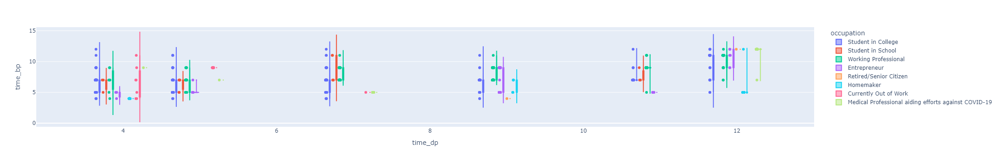

In [47]:
# Plotly Express, https://plotly.com/python/violin/
fig = px.violin(df, y="time_bp", x="time_dp", color="occupation", box=True, points="all")
fig.show()

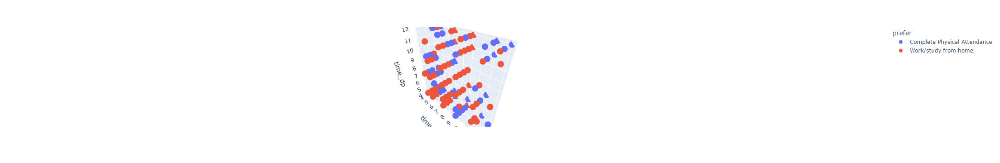

In [48]:
# Plotly Express 3D Scatter plot
fig = px.scatter_3d(df, x='fam_connect', y='time_bp', z='time_dp', color='prefer')
fig.show()

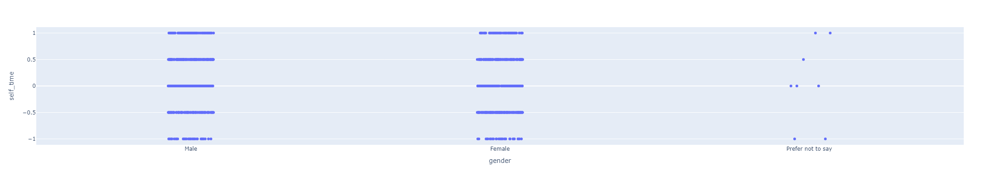

In [49]:
# Plotly Express , https://plotly.com/python/strip-charts/
fig = px.strip(df, x="gender", y="self_time",width=600, height=400)
fig.show()

2D Histogram Contours or Density Contours with Plotly Express

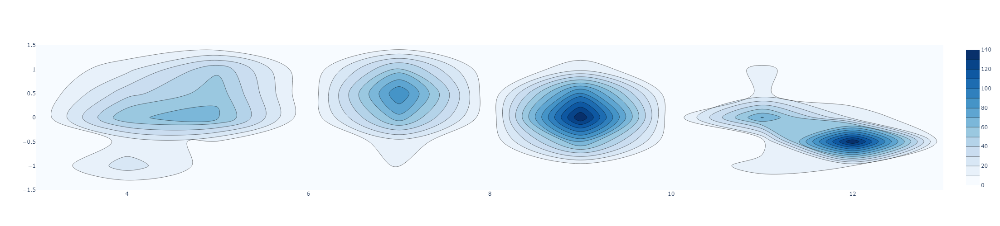

In [51]:
import plotly.graph_objects as go

fig = go.Figure(go.Histogram2dContour( x = df['time_dp'], y = df['self_time'], colorscale = 'Blues'
))
fig.update_layout(width=500, height=500)
fig.show()

Plotly Express is a better option for your EDA than Seaborn. Each Library has its own advantages, But Plotly is a clear winner when it's come to interactive grapgs which allow you to dig in to deeper insights during your EDA.

# Sweetviz report

In [54]:
# conda install -c conda-forge sweetviz
!pip install sweetviz

import sweetviz as sv

report = sv.analyze(df)
report.show_html('sweetviz_report.html')

                                             |          | [  0%]   00:00 -> (? left)

Report sweetviz_report.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [55]:
num_cols= df.select_dtypes('number').columns

skew_limit = 0.75 # define a limit above which we will log transf
skew_vals = df[num_cols].skew()
# Showing the skewed columns
skew_cols = (skew_vals
 .sort_values(ascending=False)
 .to_frame()
 .rename(columns={0:'Skew'})
 .query('abs(Skew) > {}'.format(skew_limit)))
skew_cols

,Skew
travel_time,1.073251


In [56]:
# cat_features 

cat_features = df.select_dtypes(include=['object']).columns.tolist()
cat_features = [col for col in cat_features]
cat_features


['age', 'gender', 'occupation', 'line_of_work', 'prefer', 'certaindays_hw']

In [57]:
# num_features

num_features = df.select_dtypes(include=['number']).columns.tolist()
num_features

['time_bp',
 'time_dp',
 'travel_time',
 'easeof_online',
 'home_env',
 'prod_inc',
 'sleep_bal',
 'new_skill',
 'fam_connect',
 'relaxed',
 'self_time',
 'like_hw',
 'dislike_hw']

# Data Preparation & Feature Engineering

In [59]:
# gender counts to check for any imbalances, dont see any imbalances and look sgender is distributed evenly
df.groupby(['gender']).size()

gender
Female               518
Male                 649
Prefer not to say      8
dtype: int64

In [60]:
df.groupby(['age']).size()

age
19-25     345
26-32     261
33-40     102
40-50     181
50-60     170
60+        42
Dec-18     74
dtype: int64

In [61]:
#can use replace function also
# data['age'] = data['age'].replace('Dec-18','11-18')
df.loc[df["age"] == 'Dec-18', "age"] = '11-18' # above 11 years old
df.loc[df["age"] == '60+', "age"] = '60-100' # considering only 100 years old not above
df.groupby(['age']).size()

age
11-18      74
19-25     345
26-32     261
33-40     102
40-50     181
50-60     170
60-100     42
dtype: int64

## Handling Missing Values

In [63]:
df.isnull().sum()

age                 0
gender              0
occupation          0
line_of_work      696
time_bp             0
time_dp             0
travel_time         0
easeof_online       0
home_env            0
prod_inc            0
sleep_bal           0
new_skill           0
fam_connect         0
relaxed             0
self_time           0
like_hw             0
dislike_hw          0
prefer              0
certaindays_hw      0
dtype: int64

In [64]:
# Rows with NaN is quite high so will be dropping related column - line_of_work ., Other option is Data imputation:to impuse missing data
nullRowsPer  = 696/1175 * 100
nullRowsPer

59.23404255319149

In [65]:
# line_of_work - most null and its not adding any value to dataset , so should drop
df.drop(['line_of_work'],axis=1,inplace=True)
df.isnull().sum()

age               0
gender            0
occupation        0
time_bp           0
time_dp           0
travel_time       0
easeof_online     0
home_env          0
prod_inc          0
sleep_bal         0
new_skill         0
fam_connect       0
relaxed           0
self_time         0
like_hw           0
dislike_hw        0
prefer            0
certaindays_hw    0
dtype: int64

## Handling duplicate values
As mentioned in the report that all entries are unique and cannoated as duplicate so will me skipping this

In [67]:
df.occupation.unique()

array(['Student in College', 'Student in School', 'Working Professional',
       'Entrepreneur', 'Retired/Senior Citizen', 'Homemaker',
       'Currently Out of Work',
       'Medical Professional aiding efforts against COVID-19'],
      dtype=object)

In [68]:
df['occupation'] = df['occupation'].replace('Medical Professional aiding efforts against COVID-19', 'Medical Professionals')
df.occupation.value_counts()

occupation
Working Professional      479
Student in College        358
Entrepreneur              119
Homemaker                  82
Medical Professionals      73
Currently Out of Work      44
Student in School          18
Retired/Senior Citizen      2
Name: count, dtype: int64

In [69]:
# Feature engineering , Working physically = time_bp + travel_time
df['time_bp'] = df['time_bp'] + df['travel_time']
df.head()

,age,gender,occupation,time_bp,time_dp,travel_time,easeof_online,home_env,prod_inc,sleep_bal,new_skill,fam_connect,relaxed,self_time,like_hw,dislike_hw,prefer,certaindays_hw
0,19-25,Male,Student in College,7.5,5,0.5,3,3,0.0,0.0,0.5,1.0,-0.5,-0.5,100,1,Complete Physical Attendance,Yes
1,11-18,Male,Student in School,7.5,11,0.5,4,2,-0.5,0.5,-1.0,1.0,1.0,1.0,1111,1110,Complete Physical Attendance,No
2,19-25,Male,Student in College,8.5,7,1.5,2,2,1.0,0.0,0.5,0.5,0.5,0.5,1100,111,Complete Physical Attendance,Yes
3,19-25,Male,Student in College,8.5,7,1.5,3,1,0.0,1.0,0.5,0.0,-1.0,-0.5,100,1111,Complete Physical Attendance,Yes
4,19-25,Female,Student in College,8.5,7,1.5,2,2,0.0,0.0,0.0,0.0,0.5,0.0,1010,1000,Complete Physical Attendance,Yes


In [70]:
df.groupby(['age']).agg({'time_bp':'mean', 'time_dp':'mean'})

,time_bp,time_dp
age,,
11-18,7.364865,5.702703
19-25,7.901449,6.794203
26-32,8.710728,9.371648
33-40,8.308824,7.382353
40-50,9.582873,8.690608
50-60,8.005882,9.447059
60-100,10.309524,5.309524


In [71]:
# Table 2
rename_col = {'easeof_online':'ease_of_adjustment (Average)'}
df.groupby(['age','gender']).agg({'easeof_online':'mean'}).rename(columns=rename_col)

ease_of_adjustment (Average)
age    gender                                         
11-18  Female                                 2.642857
       Male                                   3.413793
       Prefer not to say                      1.500000
19-25  Female                                 2.797101
       Male                                   2.485401
       Prefer not to say                      2.000000
26-32  Female                                 1.966387
       Male                                   1.907801
       Prefer not to say                      2.000000
33-40  Female                                 3.942857
       Male                                   3.560606
       Prefer not to say                      2.000000
40-50  Female                                 1.869863
       Male                                   2.314286
50-60  Female                                 2.664179
       Male                                   2.805556
60-100 Female                                 4.000000
       Male                                   4.076923
       Prefer not to say                      3.000000

In [72]:
# Table 3
df.groupby(['occupation']).agg({'easeof_online':'mean'}).rename(columns=rename_col)

,ease_of_adjustment (Average)
occupation,
Currently Out of Work,3.931818
Entrepreneur,2.008403
Homemaker,1.487805
Medical Professionals,3.438356
Retired/Senior Citizen,2.000000
Student in College,2.734637
Student in School,2.611111
Working Professional,2.425887


In [73]:
df.prefer.unique()

array(['Complete Physical Attendance', 'Work/study from home'],
      dtype=object)

In [74]:
df.time_dp.value_counts()

time_dp
9     326
7     238
5     180
12    169
4     149
11    113
Name: count, dtype: int64

In [75]:
df.travel_time.value_counts()

travel_time
0.5    699
1.5    343
2.5    111
3.0     22
Name: count, dtype: int64

In [76]:
df.prefer.value_counts()

prefer
Complete Physical Attendance    836
Work/study from home            339
Name: count, dtype: int64

## Outliers detection

In [78]:
df.head()

,age,gender,occupation,time_bp,time_dp,travel_time,easeof_online,home_env,prod_inc,sleep_bal,new_skill,fam_connect,relaxed,self_time,like_hw,dislike_hw,prefer,certaindays_hw
0,19-25,Male,Student in College,7.5,5,0.5,3,3,0.0,0.0,0.5,1.0,-0.5,-0.5,100,1,Complete Physical Attendance,Yes
1,11-18,Male,Student in School,7.5,11,0.5,4,2,-0.5,0.5,-1.0,1.0,1.0,1.0,1111,1110,Complete Physical Attendance,No
2,19-25,Male,Student in College,8.5,7,1.5,2,2,1.0,0.0,0.5,0.5,0.5,0.5,1100,111,Complete Physical Attendance,Yes
3,19-25,Male,Student in College,8.5,7,1.5,3,1,0.0,1.0,0.5,0.0,-1.0,-0.5,100,1111,Complete Physical Attendance,Yes
4,19-25,Female,Student in College,8.5,7,1.5,2,2,0.0,0.0,0.0,0.0,0.5,0.0,1010,1000,Complete Physical Attendance,Yes


<Axes: >

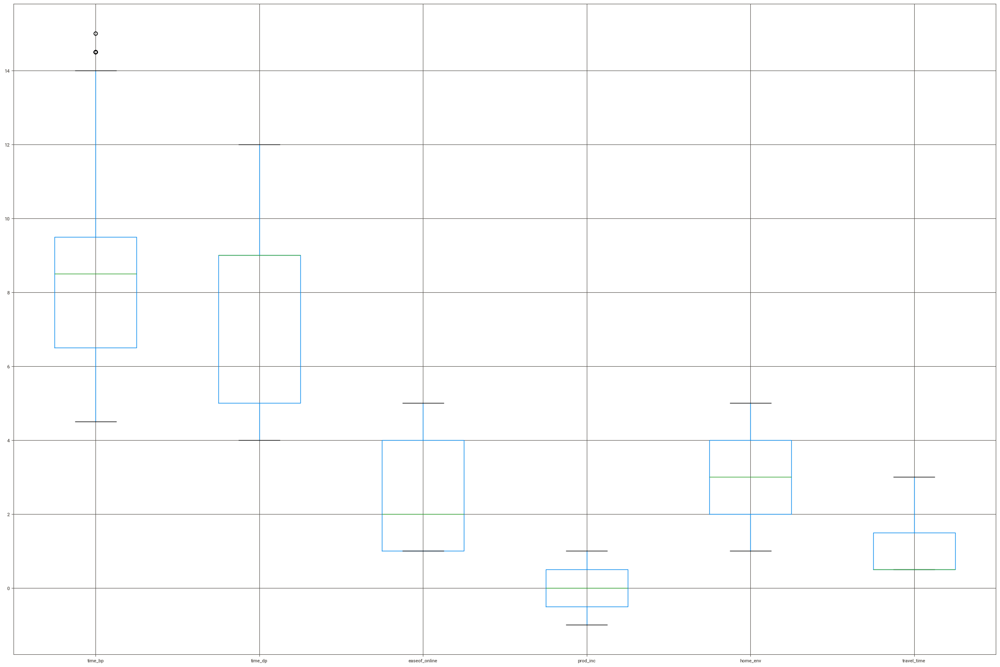

In [79]:
# time_bp (+travel_time) seems is having outliers 
df_outliers = df[['time_bp', 'time_dp', 'easeof_online', 'prod_inc','home_env','travel_time']]
df_outliers.boxplot()

<Axes: >

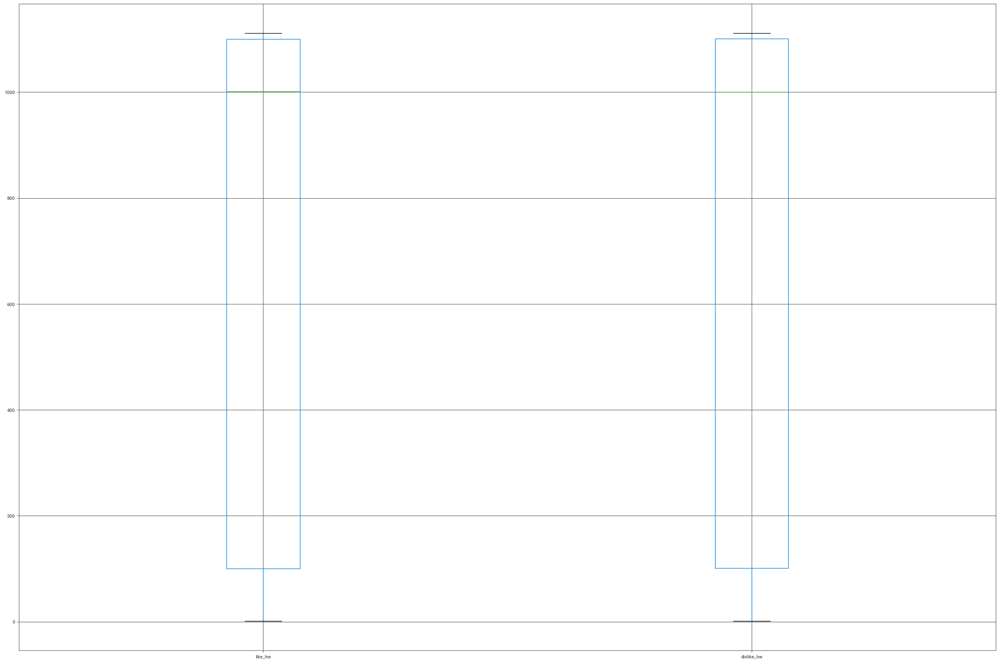

In [80]:
# no outliers on these columns
df_outliers = df[['like_hw','dislike_hw']]
df_outliers.boxplot()

In [81]:
# investigate further on time_bp (+travel_time) and detect and remove outliers from data point in case need
rslt_df = df.loc[df['time_bp'] > 15]
rslt_df.shape

(0, 18)

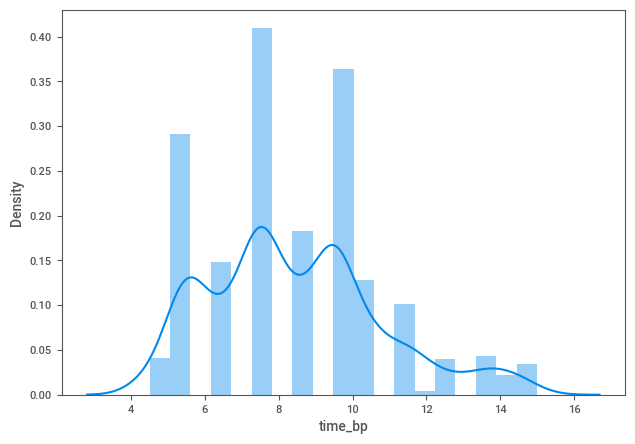

In [82]:
# Plot the distribution plots for this feature hving suspected outliers
plt.figure(figsize=(16,5))
plt.subplot(1,2,1)
sns.distplot(df['time_bp'])
plt.show()

In [83]:
print("Highest allowed",df['time_bp'].mean() + 3*df['time_bp'].std())
print("Lowest allowed",df['time_bp'].mean() - 3*df['time_bp'].std())

Highest allowed 15.406690710730404
Lowest allowed 1.4792667360781078


In [84]:
# no outliers
str = 'time_bp'
df[(df[str] > 15.40) | (df[str] < 1.48)]

,age,gender,occupation,time_bp,time_dp,travel_time,easeof_online,home_env,prod_inc,sleep_bal,new_skill,fam_connect,relaxed,self_time,like_hw,dislike_hw,prefer,certaindays_hw


In [85]:
# Outlier Detection for numerical columns using z-score
from scipy import stats

# idenity numerical columns
numerical_cols = df.select_dtypes(include=['int','float']).columns
z_scores = stats.zscore(df[numerical_cols])
#Define a threshold for outlier detection(eg , 3 standard deviations)
THRESHOLD = 3
outlier_exist = (z_scores > THRESHOLD).any().any()

if outlier_exist:
    print('Outlier exists in the dataset[numerical]')
else:
    print('No Outlier exists in the dataset[numerical]')

No Outlier exists in the dataset[numerical]


## Data imbalances check

In [87]:
# gender counts to check for any imbalances, dont see any imbalances and look sgender is distributed evenly
print(df.shape)
df.groupby(['gender']).size()

(1175, 18)


gender
Female               518
Male                 649
Prefer not to say      8
dtype: int64

In [88]:
# 'Prefer not to say' is not conributing significantly , will drop from dataframe
df = df.drop(df[df['gender'] == 'Prefer not to say'].index)
df.shape

(1167, 18)

## Apply Principle Component Anaylsis for visualizing the data in 2D space.

In [90]:
# Decided to refrain from performing Principle Component Anaylsis(PCA) seeing we have limited number of columns in the original datasets

## Encoding
Since most machine learning models only accept numerical variables, preprocessing the categorical variables becomes a necessary step. 
Refer https://www.kaggle.com/code/arashnic/an-overview-of-categorical-encoding-methods

Label encoding for classification on 'gender' / Y ie dependent

In [93]:
df['gender'].unique()

label_encoder = preprocessing.LabelEncoder() 
df['gender'] = label_encoder.fit_transform(df['gender']) 
df.head()

,age,gender,occupation,time_bp,time_dp,travel_time,easeof_online,home_env,prod_inc,sleep_bal,new_skill,fam_connect,relaxed,self_time,like_hw,dislike_hw,prefer,certaindays_hw
0,19-25,1,Student in College,7.5,5,0.5,3,3,0.0,0.0,0.5,1.0,-0.5,-0.5,100,1,Complete Physical Attendance,Yes
1,11-18,1,Student in School,7.5,11,0.5,4,2,-0.5,0.5,-1.0,1.0,1.0,1.0,1111,1110,Complete Physical Attendance,No
2,19-25,1,Student in College,8.5,7,1.5,2,2,1.0,0.0,0.5,0.5,0.5,0.5,1100,111,Complete Physical Attendance,Yes
3,19-25,1,Student in College,8.5,7,1.5,3,1,0.0,1.0,0.5,0.0,-1.0,-0.5,100,1111,Complete Physical Attendance,Yes
4,19-25,0,Student in College,8.5,7,1.5,2,2,0.0,0.0,0.0,0.0,0.5,0.0,1010,1000,Complete Physical Attendance,Yes


One-Hot Encoding for features categorial columns - Dummy Encoding Approach to have readable column names

In [95]:
# https://feaz-book.com/categorical-dummy# cat_feature
categorical_cols = ['age','occupation', 'prefer', 'certaindays_hw'] 
df = pd.get_dummies(df, columns=categorical_cols, dtype=int, drop_first=True)
##one_hot_encoder = preprocessing.OneHotEncoder(sparse_output=False) #One Hot Encoding produces non-tabular output, so need to specify -> sparse_output=False to output in array tabular format
##array_hot_encoded = one_hot_encoder.fit_transform(df[categorical_cols])
##array_hot_encoded
print(df.columns)

Index(['gender', 'time_bp', 'time_dp', 'travel_time', 'easeof_online',
       'home_env', 'prod_inc', 'sleep_bal', 'new_skill', 'fam_connect',
       'relaxed', 'self_time', 'like_hw', 'dislike_hw', 'age_19-25',
       'age_26-32', 'age_33-40', 'age_40-50', 'age_50-60', 'age_60-100',
       'occupation_Entrepreneur', 'occupation_Homemaker',
       'occupation_Medical Professionals', 'occupation_Retired/Senior Citizen',
       'occupation_Student in College', 'occupation_Student in School',
       'occupation_Working Professional', 'prefer_Work/study from home',
       'certaindays_hw_No', 'certaindays_hw_Yes'],
      dtype='object')


In [96]:
df.head()

,gender,time_bp,time_dp,travel_time,easeof_online,home_env,prod_inc,sleep_bal,new_skill,fam_connect,...,occupation_Entrepreneur,occupation_Homemaker,occupation_Medical Professionals,occupation_Retired/Senior Citizen,occupation_Student in College,occupation_Student in School,occupation_Working Professional,prefer_Work/study from home,certaindays_hw_No,certaindays_hw_Yes
0,1,7.5,5,0.5,3,3,0.0,0.0,0.5,1.0,...,0,0,0,0,1,0,0,0,0,1
1,1,7.5,11,0.5,4,2,-0.5,0.5,-1.0,1.0,...,0,0,0,0,0,1,0,0,1,0
2,1,8.5,7,1.5,2,2,1.0,0.0,0.5,0.5,...,0,0,0,0,1,0,0,0,0,1
3,1,8.5,7,1.5,3,1,0.0,1.0,0.5,0.0,...,0,0,0,0,1,0,0,0,0,1
4,0,8.5,7,1.5,2,2,0.0,0.0,0.0,0.0,...,0,0,0,0,1,0,0,0,0,1


# MACHINE LEARNING BASED PREDICTIVE MODELS 

## 1.	Perform classification 

In [99]:
df_classification = df

In [100]:
# Preprocess and splitting the dataset
features = df_classification.columns.difference(['gender'])

X=df_classification[features]
X

,age_19-25,age_26-32,age_33-40,age_40-50,age_50-60,age_60-100,certaindays_hw_No,certaindays_hw_Yes,dislike_hw,easeof_online,...,occupation_Student in School,occupation_Working Professional,prefer_Work/study from home,prod_inc,relaxed,self_time,sleep_bal,time_bp,time_dp,travel_time
0,1,0,0,0,0,0,0,1,1,3,...,0,0,0,0.0,-0.5,-0.5,0.0,7.5,5,0.5
1,0,0,0,0,0,0,1,0,1110,4,...,1,0,0,-0.5,1.0,1.0,0.5,7.5,11,0.5
2,1,0,0,0,0,0,0,1,111,2,...,0,0,0,1.0,0.5,0.5,0.0,8.5,7,1.5
3,1,0,0,0,0,0,0,1,1111,3,...,0,0,0,0.0,-1.0,-0.5,1.0,8.5,7,1.5
4,1,0,0,0,0,0,0,1,1000,2,...,0,0,0,0.0,0.5,0.0,0.0,8.5,7,1.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1170,0,0,0,1,0,0,0,1,1,2,...,0,0,0,0.5,0.0,0.0,-0.5,9.5,9,0.5
1171,0,1,0,0,0,0,0,0,111,3,...,0,0,0,-0.5,-0.5,-0.5,-1.0,5.5,12,0.5
1172,0,1,0,0,0,0,0,0,110,3,...,0,1,0,0.5,0.0,0.0,0.5,9.5,11,0.5
1173,0,1,0,0,0,0,0,1,1100,2,...,0,1,0,0.0,0.0,-0.5,0.0,12.5,12,1.5


In [101]:
# target / label attribute
y = df_classification['gender']

#y=pd.DataFrame(data = y, columns = ['gender'])
#y.head()
y

0       1
1       1
2       1
3       1
4       0
       ..
1170    0
1171    0
1172    1
1173    1
1174    1
Name: gender, Length: 1167, dtype: int32

In [102]:
# train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=0)
X_train.head()

,age_19-25,age_26-32,age_33-40,age_40-50,age_50-60,age_60-100,certaindays_hw_No,certaindays_hw_Yes,dislike_hw,easeof_online,...,occupation_Student in School,occupation_Working Professional,prefer_Work/study from home,prod_inc,relaxed,self_time,sleep_bal,time_bp,time_dp,travel_time
310,0,1,0,0,0,0,0,1,1101,3,...,0,1,0,-0.5,0.0,-0.5,-0.5,7.5,5,0.5
1100,0,1,0,0,0,0,0,1,100,2,...,0,1,1,0.5,0.5,0.5,0.5,10.5,5,1.5
520,0,1,0,0,0,0,0,1,101,2,...,0,0,1,0.5,1.0,0.0,0.5,6.5,9,1.5
1124,0,1,0,0,0,0,0,0,110,3,...,0,1,0,0.5,0.0,0.0,0.5,9.5,11,0.5
859,0,0,0,1,0,0,0,1,111,2,...,0,1,0,0.0,0.5,0.5,0.0,11.5,9,2.5


In [103]:
# Standardization doesn’t have any fixed minimum or maximum value. Here, the values of all the columns are scaled in such a way that they all have a mean equal to 0 and standard deviation equal to 1.
from sklearn.preprocessing import StandardScaler

std_scaler = StandardScaler()
#X_train = pd.DataFrame(std_scaler.fit_transform(X_train), columns=X.columns) # retained featue names
X_train = std_scaler.fit_transform(X_train)
X_test =  std_scaler.fit_transform(X_test)
std_scaler

StandardScaler()

In [104]:
def print_model_perf_metrices(y_test, prediction):
    print ('Accuracy:', accuracy_score(y_test, prediction))
    print ('F1 score:', f1_score(y_test, prediction))
    print ('Recall:', recall_score(y_test, prediction))
    print ('Precision:', precision_score(y_test, prediction))
    print('Jaccard_ Score: ', (jaccard_score(y_test, prediction, average='micro')))
    print('Log Loss : ', (log_loss(y_test, prediction)))
    print ('\n clasification report:\n', classification_report(y_test,prediction))
	
    cm = metrics.confusion_matrix(y_test, prediction)
    print ('\n confusion matrix:\n', cm)
	
    #https://www.datacamp.com/tutorial/understanding-logistic-regression-python
	# Visualizing confusion matrix using a heatmap
    plt.figure(figsize=(9,9))
	# create heatmap
    sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r');
    ax.xaxis.set_label_position("top")
    plt.ylabel('Actual label')
    plt.xlabel('Predicted label')
    title = 'Accuracy Score: {0}'.format(accuracy_score(y_test, prediction))
    plt.title(title, size = 15);

    print ('\n roc_auc_score:', roc_auc_score(y_test, prediction))

In [105]:
def plot_roc(y_test, classifier):

    probability = classifier.predict_proba(X_test)
    probability = probability[:,1 ]

    auc = roc_auc_score(y_test, probability)
    print ('\n auc score :\n', auc)
    
    fpr, tpr, thresholds = roc_curve(y_test, probability)
    
    #https://www.datacamp.com/tutorial/understanding-logistic-regression-python
    #Receiver Operating Characteristic (ROC) curve is a plot of the true positive rate against the false positive rate. It shows the tradeoff between sensitivity and specificity.
    plt.plot([0,1], [0,1], linestyle='--')
    plt.plot(fpr,tpr, label = auc)
    plt.legend(loc=4)
    plt.show()

# LogisticRegression

In [107]:
logisticRegr = LogisticRegression(solver='newton-cholesky', max_iter=30000)
#solver{‘lbfgs’, ‘liblinear’, ‘newton-cg’, ‘newton-cholesky’, ‘sag’, ‘saga’}, default=’lbfgs’

logisticRegr.fit(X_train, y_train)
prediction = logisticRegr.predict(X_test)

# Use score method to get accuracy of model
# Compute the accuracy
accuracy_score(y_test, prediction)

0.8595890410958904

Accuracy: 0.8595890410958904
F1 score: 0.8790560471976401
Recall: 0.9141104294478528
Precision: 0.8465909090909091
Jaccard_ Score:  0.7537537537537538
Log Loss :  5.060923934773299

 clasification report:
               precision    recall  f1-score   support

           0       0.88      0.79      0.83       129
           1       0.85      0.91      0.88       163

    accuracy                           0.86       292
   macro avg       0.86      0.85      0.86       292
weighted avg       0.86      0.86      0.86       292


 confusion matrix:
 [[102  27]
 [ 14 149]]

 roc_auc_score: 0.8524040519332288


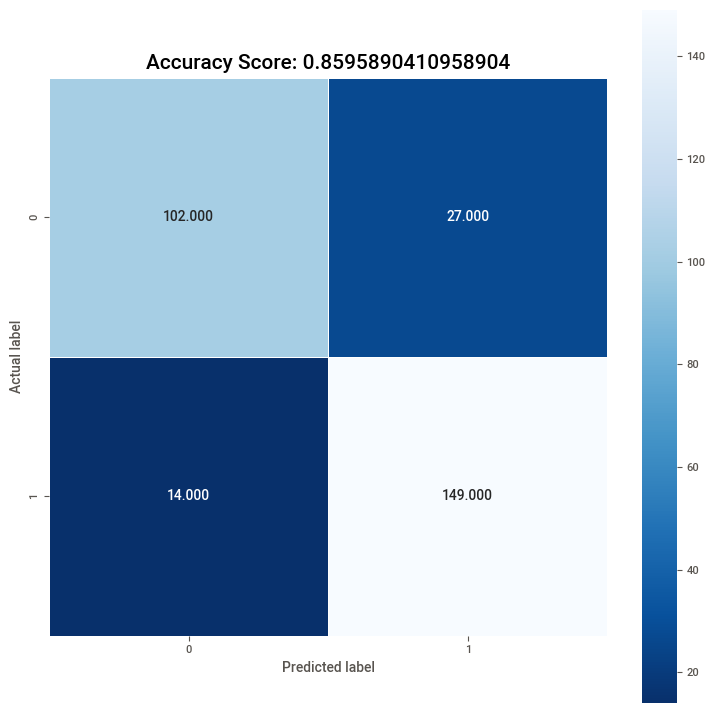

In [108]:
print_model_perf_metrices(y_test=y_test, prediction=prediction)

In [109]:
def plot_roc(y_test, classifier):

    probability = classifier.predict_proba(X_test)
    probability = probability[:,1 ]

    auc = roc_auc_score(y_test, probability)
    print ('\n auc score :\n', auc)
    
    fpr, tpr, thresholds = roc_curve(y_test, probability)
    
    #https://www.datacamp.com/tutorial/understanding-logistic-regression-python
    #Receiver Operating Characteristic (ROC) curve is a plot of the true positive rate against the false positive rate. It shows the tradeoff between sensitivity and specificity.
    plt.plot([0,1], [0,1], linestyle='--')
    plt.plot(fpr,tpr, label = auc)
    plt.legend(loc=4)
    plt.show()


 auc score :
 0.9182955248014457


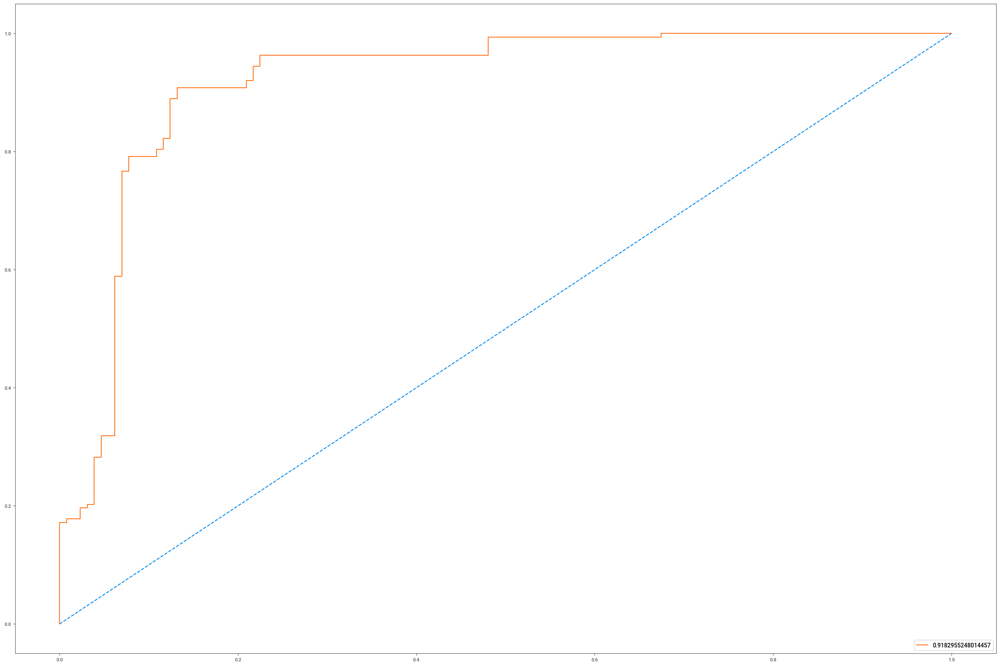

In [110]:
plot_roc(y_test=y_test, classifier = logisticRegr)

# XGBClassifier

In [112]:
xgboost = XGBClassifier(n_estimators=100, random_state=123)
xgboost.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=100, n_jobs=None,
              num_parallel_tree=None, random_state=123, ...)

In [113]:
xgboost_pred = xgboost.predict(X_test)

Accuracy: 0.7876712328767124
F1 score: 0.8121212121212121
Recall: 0.8220858895705522
Precision: 0.8023952095808383
Jaccard_ Score:  0.6497175141242938
Log Loss :  7.6531044867303555

 clasification report:
               precision    recall  f1-score   support

           0       0.77      0.74      0.76       129
           1       0.80      0.82      0.81       163

    accuracy                           0.79       292
   macro avg       0.79      0.78      0.78       292
weighted avg       0.79      0.79      0.79       292


 confusion matrix:
 [[ 96  33]
 [ 29 134]]

 roc_auc_score: 0.7831359680410901


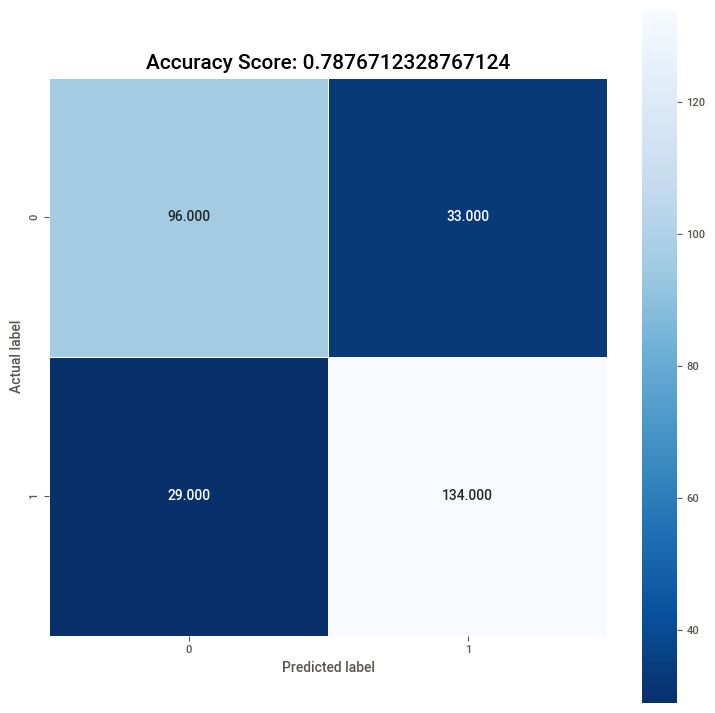

In [114]:
print_model_perf_metrices(y_test=y_test, prediction=xgboost_pred)


 auc score :
 0.8761592238550435


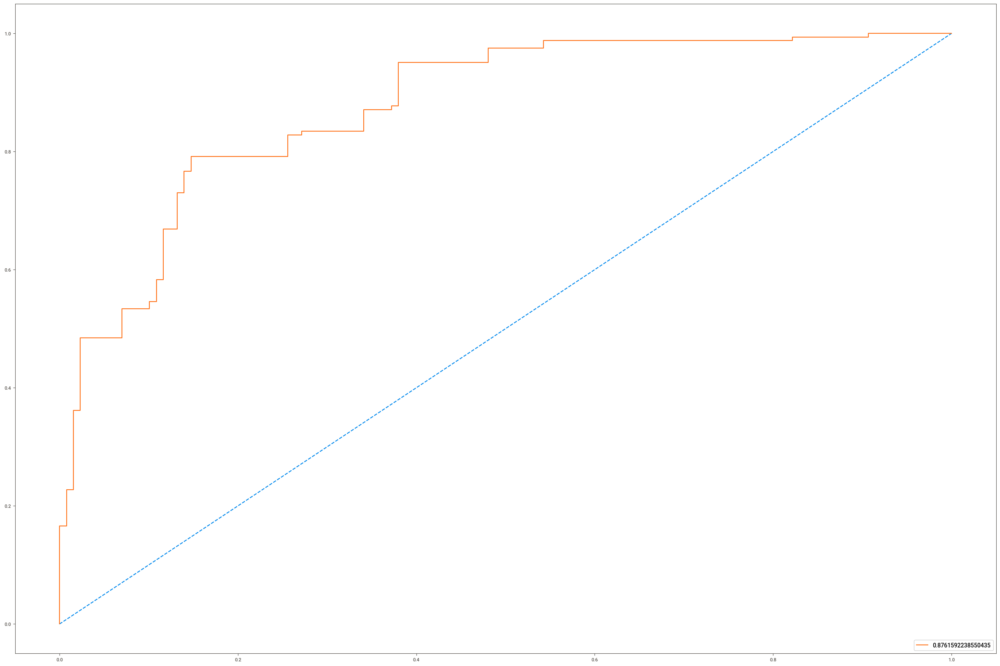

In [115]:
plot_roc(y_test=y_test, classifier = xgboost)

In [116]:
# Let try to do Hyperparameter tuning with RandomizedSearchCV to understand how this tuning works to improve the model performance
from sklearn.model_selection import RandomizedSearchCV

# Define a parameter grid
rs_param_grid = {
    # max_depth: values from 3 to 200
    'max_depth': list((range(3,200))),
    # alpha: values 0, .001, .01, .1
    'alpha': [0,0.001, 0.01,0.1,1],
    # subsample: values 0.25,0.5,0.75, 1
    'subsample': [0.5,0.75,1],
    # learning rate: ten values between 0.01 - 0.5
    'learning_rate': np.linspace(0.01,0.5, 10),
    # n_estimators: values 10, 25, 40
    'n_estimators': [10, 25, 40, 50, 75, 100, 125, 150, 175, 200, 225]
    }


# Insantiate XGBoost Clasifier 
xgb_clf = XGBClassifier(random_state=123)

# Instantiate RandomizedSearchCV()
xgb_rs = RandomizedSearchCV(estimator=xgb_clf,param_distributions=rs_param_grid, 
                                cv=3, n_iter=5, verbose=2, random_state=123)

# Train the model on the training set
xgb_rs.fit(X_train, y_train)

# Print the best parameters and highest accuracy
print("Best parameters found: ", xgb_rs.best_params_)
print("Best accuracy found: ", xgb_rs.best_score_)

Fitting 3 folds for each of 5 candidates, totalling 15 fits
[CV] END alpha=0.1, learning_rate=0.44555555555555554, max_depth=72, n_estimators=200, subsample=0.5; total time=   0.0s
[CV] END alpha=0.1, learning_rate=0.44555555555555554, max_depth=72, n_estimators=200, subsample=0.5; total time=   0.0s
[CV] END alpha=0.1, learning_rate=0.44555555555555554, max_depth=72, n_estimators=200, subsample=0.5; total time=   0.0s
[CV] END alpha=1, learning_rate=0.11888888888888888, max_depth=149, n_estimators=50, subsample=0.5; total time=   0.0s
[CV] END alpha=1, learning_rate=0.11888888888888888, max_depth=149, n_estimators=50, subsample=0.5; total time=   0.0s
[CV] END alpha=1, learning_rate=0.11888888888888888, max_depth=149, n_estimators=50, subsample=0.5; total time=   0.0s
[CV] END alpha=0, learning_rate=0.22777777777777777, max_depth=64, n_estimators=75, subsample=0.75; total time=   0.0s
[CV] END alpha=0, learning_rate=0.22777777777777777, max_depth=64, n_estimators=75, subsample=0.75; t

# Support Vector Machine

In [118]:
svc_scores = []
kernels = ['linear','poly','rbf', 'sigmoid']
print('start..')
for i in range(len(kernels)):
    print(i)
    svc_classifier = SVC(kernel = kernels[i])
    svc_classifier.fit(X_train, y_train)
    svc_scores.append(round(svc_classifier.score(X_train, y_train), 2))

print(svc_scores)

start..
0
1
2
3
[0.86, 0.92, 0.91, 0.67]


In [119]:
# Best kernel works is 'poly' so lets perform fitting on this kernel
svc_classifier = SVC(kernel = 'poly')
svc_classifier.fit(X_train, y_train)
svc_prediction = svc_classifier.predict(X_test)

# Compute the accuracy
accuracy_score(y_test, svc_prediction)

0.9315068493150684

Accuracy: 0.9315068493150684
F1 score: 0.9418604651162791
Recall: 0.9938650306748467
Precision: 0.8950276243093923
Jaccard_ Score:  0.8717948717948718
Log Loss :  2.468743382816243

 clasification report:
               precision    recall  f1-score   support

           0       0.99      0.85      0.92       129
           1       0.90      0.99      0.94       163

    accuracy                           0.93       292
   macro avg       0.94      0.92      0.93       292
weighted avg       0.94      0.93      0.93       292


 confusion matrix:
 [[110  19]
 [  1 162]]

 roc_auc_score: 0.9232891044847101


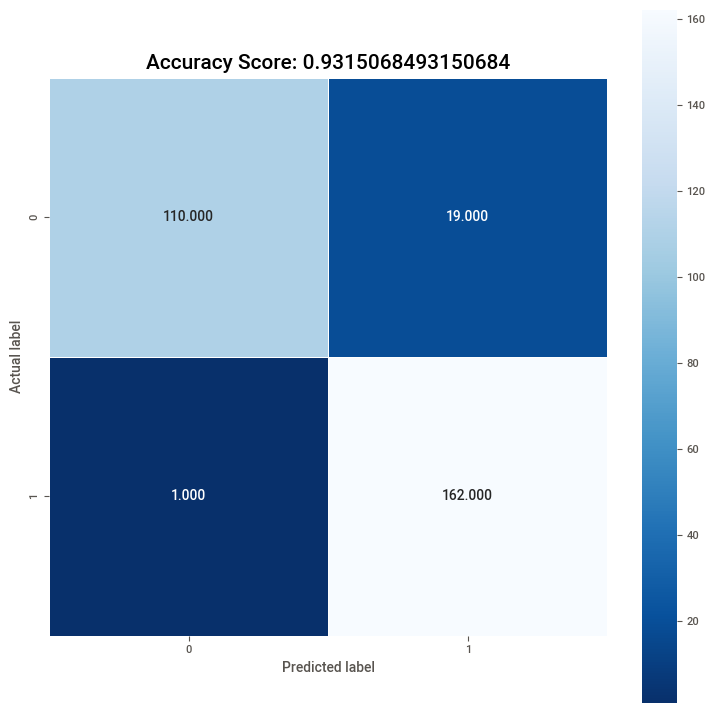

In [120]:
print_model_perf_metrices(y_test=y_test, prediction=svc_prediction)

# RandomForestClassifier

In [122]:
rfc = RandomForestClassifier(random_state=42, n_jobs=-1, max_depth=5, n_estimators=100, oob_score=True)

rfc.fit(X_train, y_train)

RandomForestClassifier(max_depth=5, n_jobs=-1, oob_score=True, random_state=42)

In [123]:
# checking the oob score
rfc.oob_score_

0.8902857142857142

In [124]:
# hyperparameter tuning for Random Forest using GridSearchCV and fit the data
rfc = RandomForestClassifier(random_state=42, n_jobs=-1)

params = {
    'max_depth': [None,2,3,5,10,20],
    'min_samples_leaf': [5,10,20,50,100,200],
    'n_estimators': [10,25,30,50,100,200],
    'max_features': [None,'sqrt','log2'],
    'random_state': [0, 42]
}

from sklearn.model_selection import GridSearchCV

# Instantiate the grid search model
grid_search = GridSearchCV(estimator=rfc,
                           param_grid=params,
                           cv = 4,
                           n_jobs=-1, verbose=1, scoring="accuracy")

grid_search.fit(X_train, y_train)

Fitting 4 folds for each of 1296 candidates, totalling 5184 fits


GridSearchCV(cv=4, estimator=RandomForestClassifier(n_jobs=-1, random_state=42),
             n_jobs=-1,
             param_grid={'max_depth': [None, 2, 3, 5, 10, 20],
                         'max_features': [None, 'sqrt', 'log2'],
                         'min_samples_leaf': [5, 10, 20, 50, 100, 200],
                         'n_estimators': [10, 25, 30, 50, 100, 200],
                         'random_state': [0, 42]},
             scoring='accuracy', verbose=1)

In [125]:
print(grid_search.best_params_)

{'max_depth': None, 'max_features': None, 'min_samples_leaf': 5, 'n_estimators': 200, 'random_state': 0}


In [126]:
rf_best = grid_search.best_estimator_
rf_best

RandomForestClassifier(max_features=None, min_samples_leaf=5, n_estimators=200,
                       n_jobs=-1, random_state=0)

In [127]:
# Use tuned parameters on Random Forest Classifier
rfc = RandomForestClassifier(max_features=None, min_samples_leaf=5, n_estimators=200,
                       n_jobs=-1, random_state=0)

rfc.fit(X_train, y_train)

RandomForestClassifier(max_features=None, min_samples_leaf=5, n_estimators=200,
                       n_jobs=-1, random_state=0)

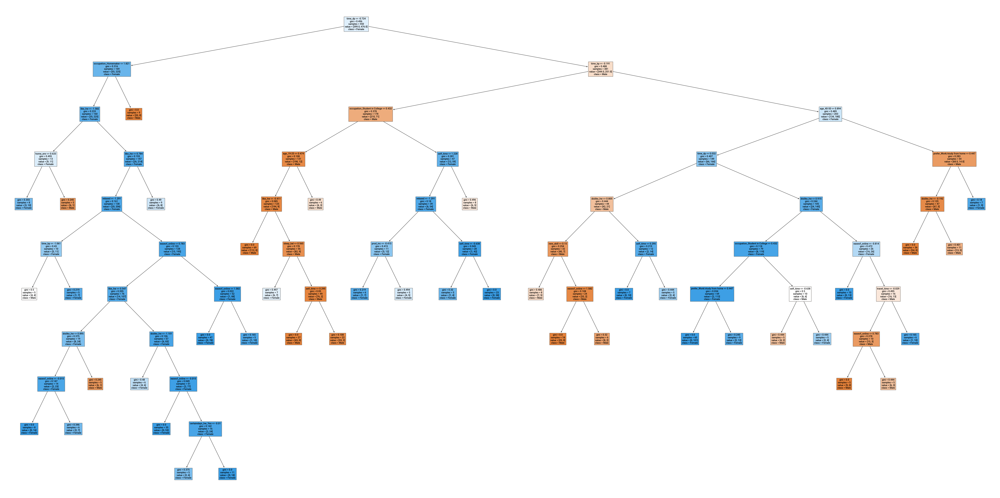

In [128]:
from sklearn.tree import plot_tree

plt.figure(figsize=(80,40))
plot_tree(rf_best.estimators_[5], feature_names = X.columns,class_names=['Male', "Female"],filled=True);

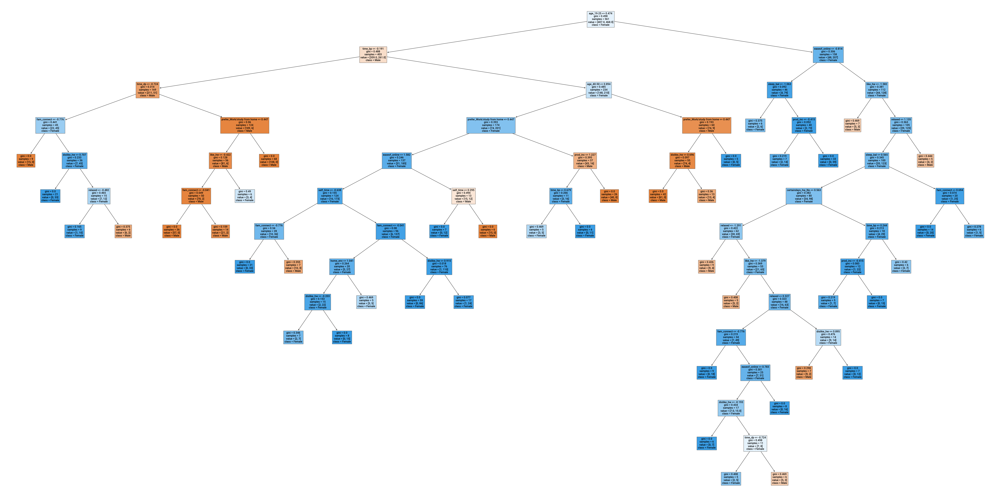

In [129]:
# The trees created by estimators_[5] and estimators_[7] are different. Thus we can say that each tree is independent of the other.
plt.figure(figsize=(80,40))
plot_tree(rf_best.estimators_[7], feature_names = X.columns,class_names=['Male', "Female"],filled=True);

In [130]:
y_pred = rfc.predict(X_test)

Accuracy: 0.9178082191780822
F1 score: 0.9285714285714286
Recall: 0.9570552147239264
Precision: 0.9017341040462428
Jaccard_ Score:  0.8481012658227848
Log Loss :  2.962492059379492

 clasification report:
               precision    recall  f1-score   support

           0       0.94      0.87      0.90       129
           1       0.90      0.96      0.93       163

    accuracy                           0.92       292
   macro avg       0.92      0.91      0.92       292
weighted avg       0.92      0.92      0.92       292


 confusion matrix:
 [[112  17]
 [  7 156]]

 roc_auc_score: 0.9126361344937461


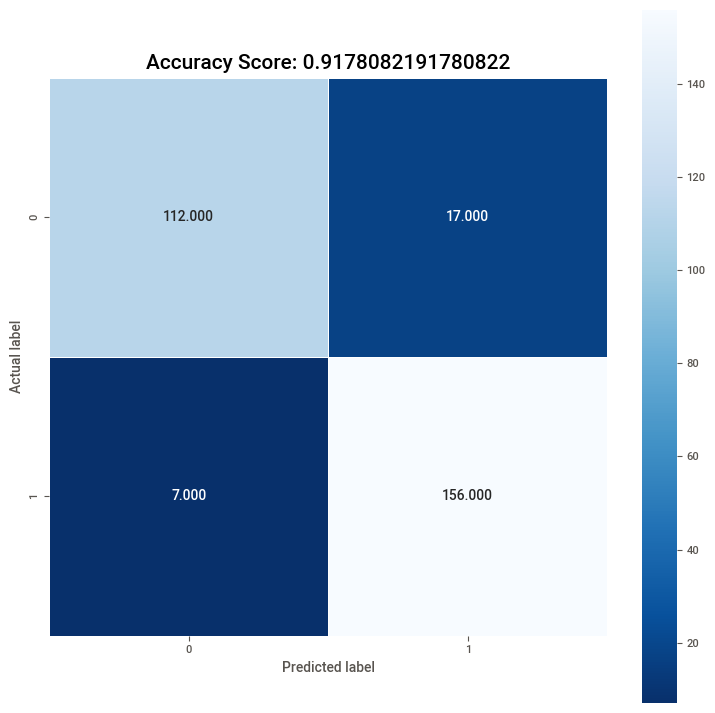

In [131]:
print_model_perf_metrices(y_test=y_test, prediction=y_pred)


 auc score :
 0.9760783754220763


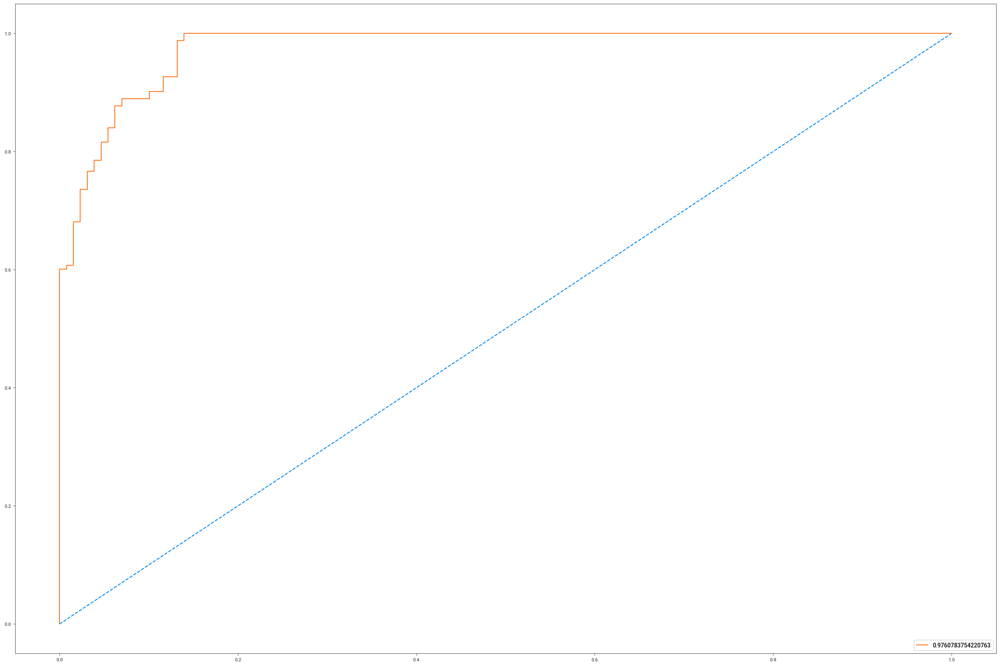

In [132]:
plot_roc(y_test=y_test, classifier = rfc)

# DecisionTreeClassifier

In [134]:
dtc = DecisionTreeClassifier(criterion='gini', splitter='best', random_state = 5) # criterion{“gini”, “entropy”, “log_loss”}, default=”gini”
dtc.fit(X_train,y_train)

predict_dtc = dtc.predict(X_test)
predict_dtc

array([0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0,
       1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 1,
       1, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1,
       1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1,
       1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1,
       1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1,
       1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1,
       0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1,
       1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
       0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1,
       1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1,
       0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0,
       1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0,
       1, 0, 1, 0, 1, 1])

Accuracy: 0.8424657534246576
F1 score: 0.8580246913580247
Recall: 0.852760736196319
Precision: 0.8633540372670807
Jaccard_ Score:  0.727810650887574
Log Loss :  5.67810978047736

 clasification report:
               precision    recall  f1-score   support

           0       0.82      0.83      0.82       129
           1       0.86      0.85      0.86       163

    accuracy                           0.84       292
   macro avg       0.84      0.84      0.84       292
weighted avg       0.84      0.84      0.84       292


 confusion matrix:
 [[107  22]
 [ 24 139]]

 roc_auc_score: 0.8411090502687022


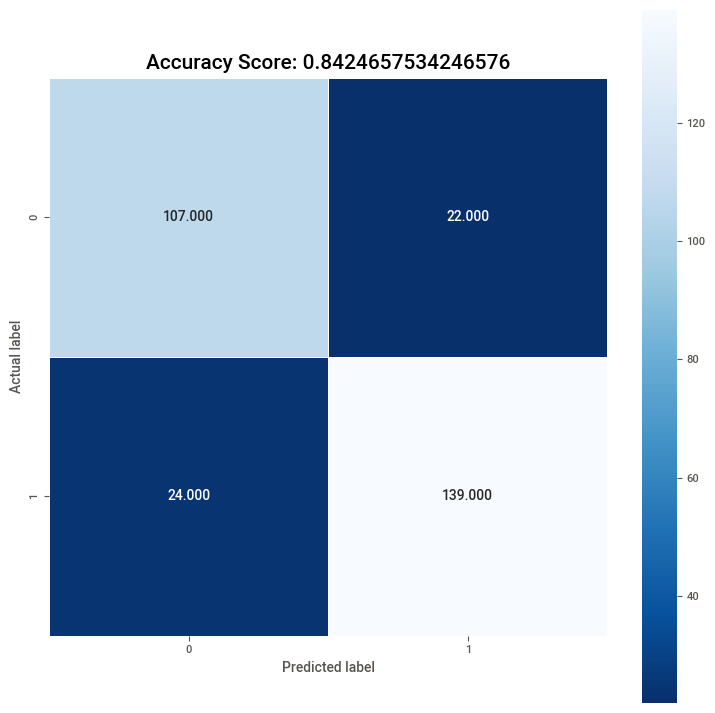

In [135]:
print_model_perf_metrices(y_test=y_test, prediction=predict_dtc)

# PassiveAggressiveClassifier

In [137]:
pac = PassiveAggressiveClassifier(C = 1, random_state = 5, max_iter=50)
# Fitting model 
pac.fit(X_train,y_train)

# Making prediction on test set
predict_pac = pac.predict(X_test)

Accuracy: 0.791095890410959
F1 score: 0.8262108262108262
Recall: 0.8895705521472392
Precision: 0.7712765957446809
Jaccard_ Score:  0.6543909348441926
Log Loss :  7.529667317589542

 clasification report:
               precision    recall  f1-score   support

           0       0.83      0.67      0.74       129
           1       0.77      0.89      0.83       163

    accuracy                           0.79       292
   macro avg       0.80      0.78      0.78       292
weighted avg       0.80      0.79      0.79       292


 confusion matrix:
 [[ 86  43]
 [ 18 145]]

 roc_auc_score: 0.778118609406953


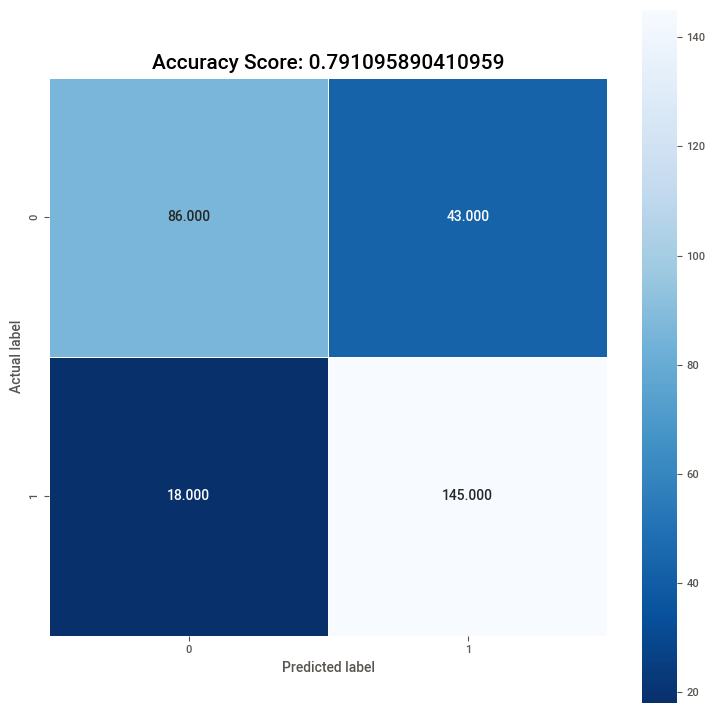

In [138]:
print_model_perf_metrices(y_test=y_test, prediction=predict_pac)

## AdaBoostClassifier

Accuracy: 0.9143835616438356
F1 score: 0.9253731343283582
Recall: 0.950920245398773
Precision: 0.9011627906976745
Jaccard_ Score:  0.8422712933753943
Log Loss :  3.085929228520304

 clasification report:
               precision    recall  f1-score   support

           0       0.93      0.87      0.90       129
           1       0.90      0.95      0.93       163

    accuracy                           0.91       292
   macro avg       0.92      0.91      0.91       292
weighted avg       0.92      0.91      0.91       292


 confusion matrix:
 [[112  17]
 [  8 155]]

 roc_auc_score: 0.9095686498311694


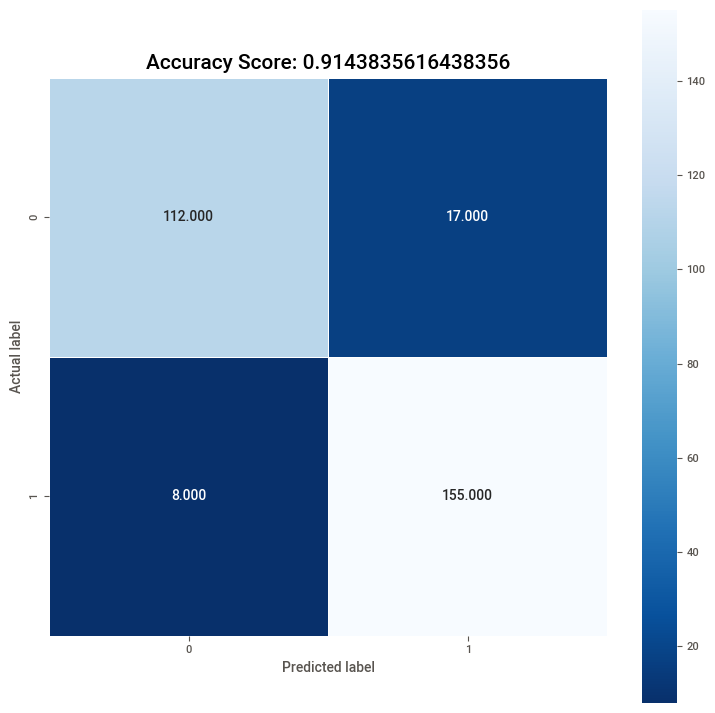

In [140]:
abc = AdaBoostClassifier(n_estimators=50, learning_rate=1, random_state=0)

# Train Adaboost Classifer
model1 = abc.fit(X_train, y_train)


#Predict the response for test dataset
predict_adaboost = model1.predict(X_test)

print_model_perf_metrices(y_test=y_test, prediction=predict_adaboost)


 auc score :
 0.9433585390212583


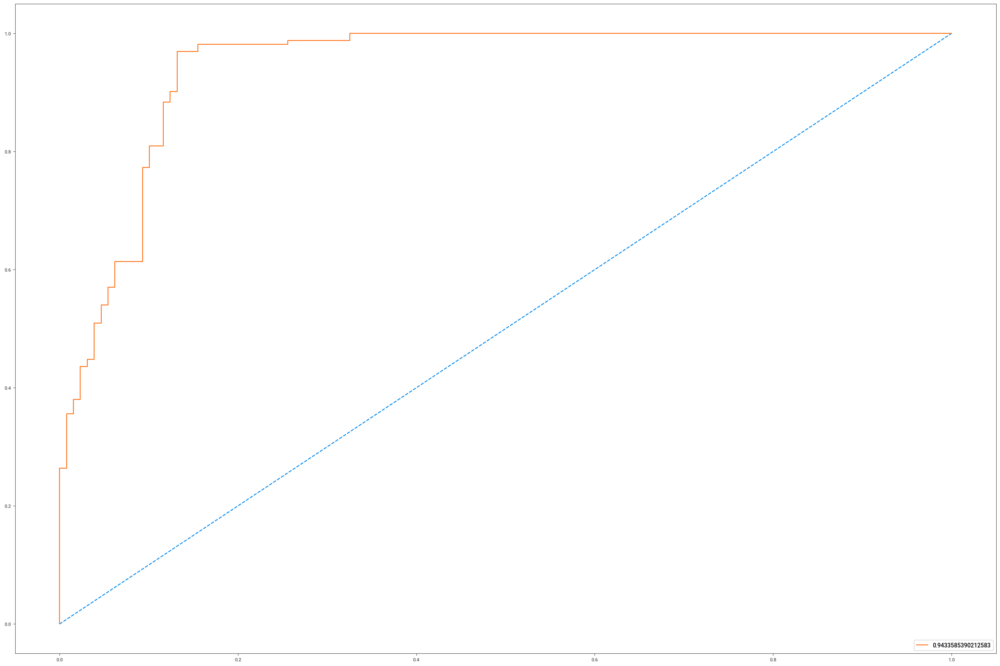

In [141]:
plot_roc(y_test=y_test, classifier = abc)

# K-Nearest Neighbors

Accuracy: 0.9178082191780822
F1 score: 0.9254658385093167
Recall: 0.9141104294478528
Precision: 0.9371069182389937
Jaccard_ Score:  0.8481012658227848
Log Loss :  2.962492059379492

 clasification report:
               precision    recall  f1-score   support

           0       0.89      0.92      0.91       129
           1       0.94      0.91      0.93       163

    accuracy                           0.92       292
   macro avg       0.92      0.92      0.92       292
weighted avg       0.92      0.92      0.92       292


 confusion matrix:
 [[119  10]
 [ 14 149]]

 roc_auc_score: 0.9182955248014457


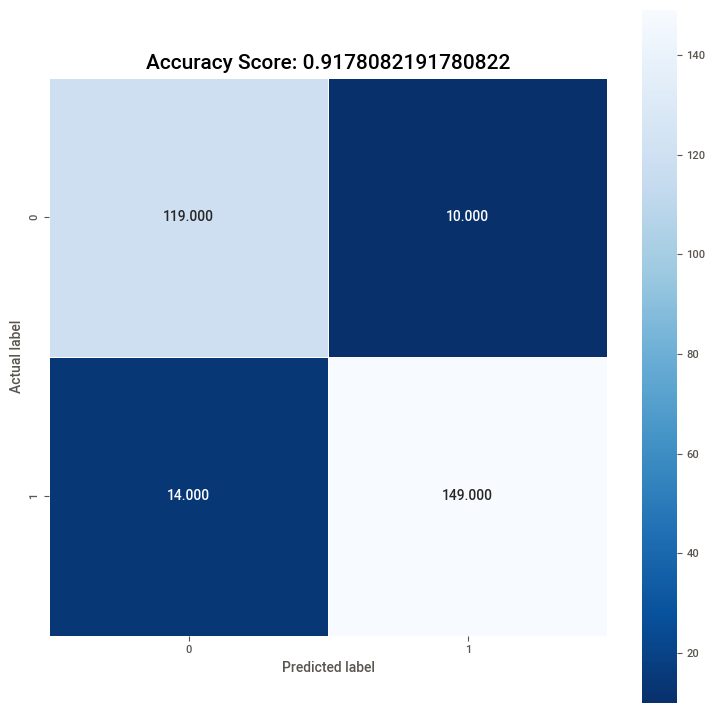

In [143]:
from sklearn.neighbors import KNeighborsClassifier

kNeigh = KNeighborsClassifier(n_neighbors=3)

# Train Adaboost Classifer
model1 = kNeigh.fit(X_train, y_train)


#Predict the response for test dataset
predict_kNeigh = kNeigh.predict(X_test)

print_model_perf_metrices(y_test=y_test, prediction=predict_kNeigh)


 auc score :
 0.9645455842488231


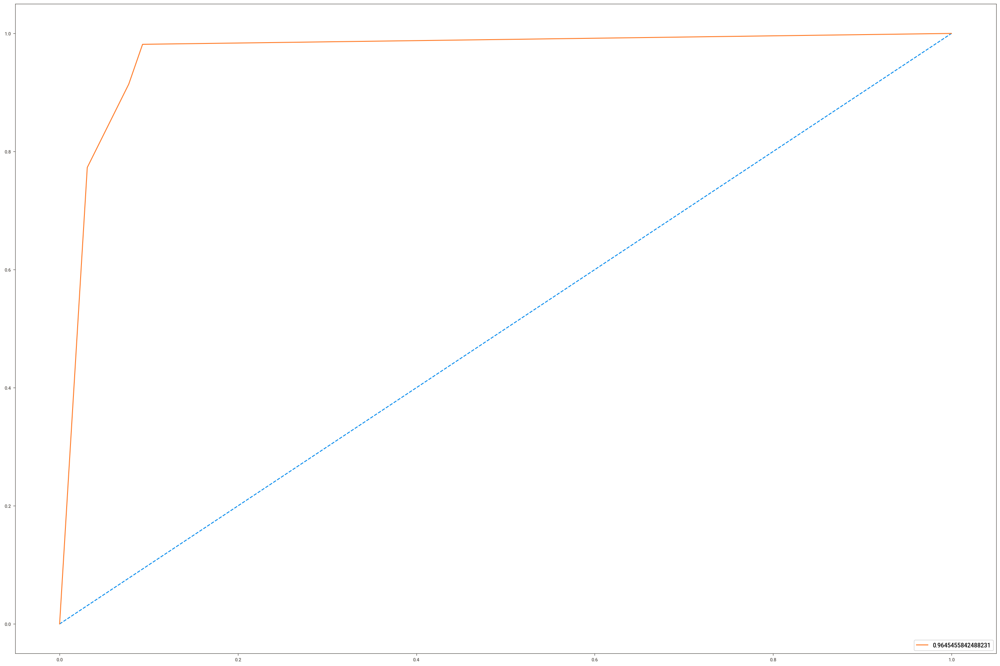

In [144]:
plot_roc(y_test=y_test, classifier=kNeigh)

# GradientBoostingClassifier

Accuracy: 0.9075342465753424
F1 score: 0.9179331306990881
Recall: 0.9263803680981595
Precision: 0.9096385542168675
Jaccard_ Score:  0.8307210031347962
Log Loss :  3.3328035668019282

 clasification report:
               precision    recall  f1-score   support

           0       0.90      0.88      0.89       129
           1       0.91      0.93      0.92       163

    accuracy                           0.91       292
   macro avg       0.91      0.91      0.91       292
weighted avg       0.91      0.91      0.91       292


 confusion matrix:
 [[114  15]
 [ 12 151]]

 roc_auc_score: 0.9050506491653588


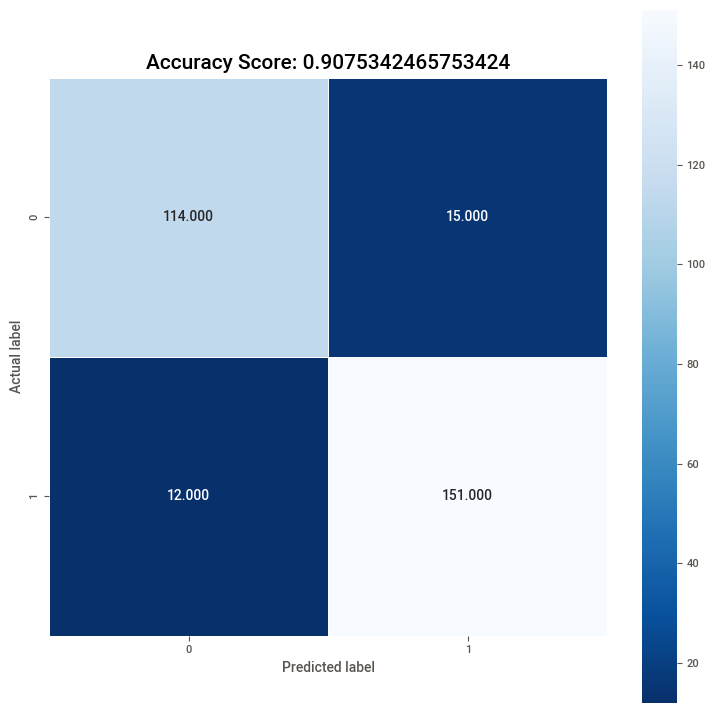

In [146]:
gb=GradientBoostingClassifier(n_estimators=134,learning_rate=0.2)

gb.fit(X_train, y_train)
predict_gb = gb.predict(X_test)

print_model_perf_metrices(y_test=y_test, prediction=predict_gb)


 auc score :
 0.9561040566890189


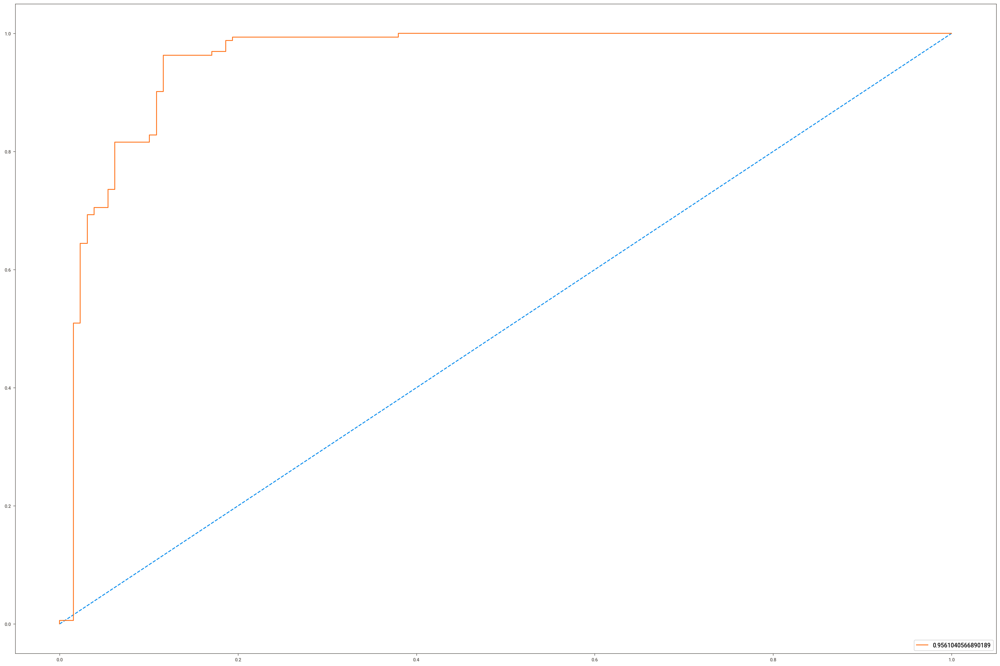

In [147]:
plot_roc(y_test=y_test, classifier=gb)

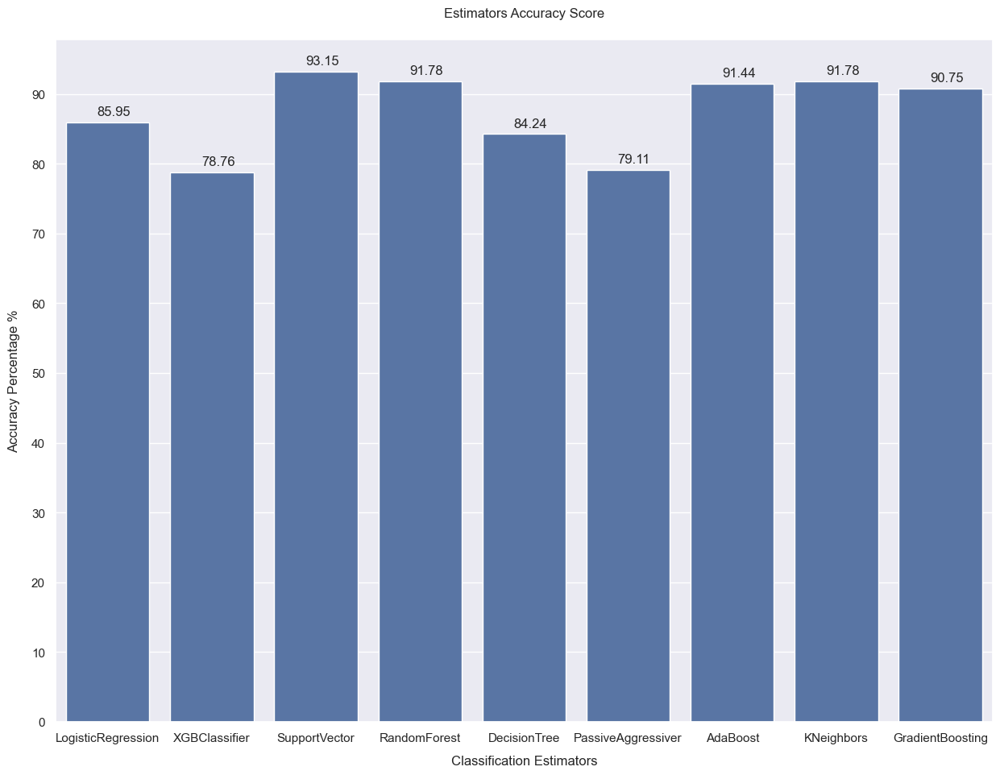

In [148]:
accuracy = [85.95, 78.76, 93.15, 91.78, 84.24,79.11,91.44,91.78,90.75]
estimators = ['LogisticRegression',
              'XGBClassifier',
              'SupportVector',
              'RandomForest',
              'DecisionTree',
              'PassiveAggressiver',
              'AdaBoost',
              'KNeighbors',
              'GradientBoosting']

model_accuracy = pd.DataFrame({'accuracy':accuracy, 'estimators':estimators})

sns.set_theme(rc={'figure.figsize':(15,11)})
model_accuracy = sns.barplot(
    data= model_accuracy,
    x= 'estimators',
    y= 'accuracy')
plt.yticks(np.arange(0,100,10))
plt.ylabel('Accuracy Percentage %',labelpad=10)
plt.xlabel('Classification Estimators',labelpad=10)
plt.title('Estimators Accuracy Score',pad=20)

for p in model_accuracy.patches:
        model_accuracy.annotate(p.get_height(), (p.get_x(), p.get_height()),xytext=(p.get_x()+0.3,p.get_height()+1.02))
plt.show()

# 2.	Perform regression 

In [150]:
df_regression = df
df_regression.head()

,gender,time_bp,time_dp,travel_time,easeof_online,home_env,prod_inc,sleep_bal,new_skill,fam_connect,...,occupation_Entrepreneur,occupation_Homemaker,occupation_Medical Professionals,occupation_Retired/Senior Citizen,occupation_Student in College,occupation_Student in School,occupation_Working Professional,prefer_Work/study from home,certaindays_hw_No,certaindays_hw_Yes
0,1,7.5,5,0.5,3,3,0.0,0.0,0.5,1.0,...,0,0,0,0,1,0,0,0,0,1
1,1,7.5,11,0.5,4,2,-0.5,0.5,-1.0,1.0,...,0,0,0,0,0,1,0,0,1,0
2,1,8.5,7,1.5,2,2,1.0,0.0,0.5,0.5,...,0,0,0,0,1,0,0,0,0,1
3,1,8.5,7,1.5,3,1,0.0,1.0,0.5,0.0,...,0,0,0,0,1,0,0,0,0,1
4,0,8.5,7,1.5,2,2,0.0,0.0,0.0,0.0,...,0,0,0,0,1,0,0,0,0,1


In [151]:
df_regression["self_time"]

0      -0.5
1       1.0
2       0.5
3      -0.5
4       0.0
       ... 
1170    0.0
1171   -0.5
1172    0.0
1173   -0.5
1174    0.5
Name: self_time, Length: 1167, dtype: float64

In [152]:
def modelEval(df_regression,feature='self_time',model_id = 'dummy'):
    
    # Input: Feature & Target DataFrame

    #need to convert all features/columns name to str
    #ldf.columns = ldf.columns.astype(str)

    # Split feature/target variable
    y = df_regression[feature].copy()
    X = df_regression.copy()
    del X[feature]     # remove target variable
     
    if(model_id is 'dummy'):    model = DummyRegressor()
    if(model_id is 'lr'):       model = LinearRegression()
    if(model_id is 'br'):       model = BayesianRidge()
    if(model_id is 'rf'):       model = RandomForestRegressor(n_estimators=10,random_state=10)
    if(model_id is 'gbr'):      model = GradientBoostingRegressor(random_state=0)
    if(model_id is 'xgb'):      model = XGBRegressor(eval_metric='rmsle')
    if(model_id is 'dtr'):      model = DecisionTreeRegressor(random_state=0)
    
    ''' Standard Cross Validation '''
    #https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.cross_val_score.html
    #Cross-validation is a set of techniques (KFold, StratifiedKFold, LeaveOneOut,) that combine the measures of prediction performance to get more accurate model estimations.
    cv_score = np.sqrt(-cross_val_score(model,X,y,cv=5,scoring='neg_mean_squared_error'))
    print("Scores:",cv_score);
    print("Mean:", cv_score.mean());
    print("std:", cv_score.std())

    # train_test_split
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=0)

    # Standardization , it improved the scores for each models
    std_scaler = StandardScaler()
    X_train = std_scaler.fit_transform(X_train)
    X_test = std_scaler.transform(X_test)

    model = model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    print("Score on Train Data:", model.score(X_train, y_train))
    print("Score on Test Data:", model.score(X_test, y_test))
    
    mean_squared_err = mean_squared_error(y_test, y_pred,squared=False)
    mean_absolute_err = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    
    print("mean_squared_error:",mean_squared_err)
    print("mean_absolute_error:",mean_absolute_err)
    print("r2_score:",r2)
    
    if(model_id is 'lr'):
        print("intercept_ : ",model.intercept_)
        print("coef_ : ",model.coef_) # slopr

In [153]:
# A simple comparison model
modelEval(df_regression,model_id='dummy')

Scores: [0.59755885 0.57967512 0.5157326  0.51009201 0.49002813]
Mean: 0.5386173411175315
std: 0.042090758826045405
Score on Train Data: 0.0
Score on Test Data: -0.00416509121225328
mean_squared_error: 0.5511056383830003
mean_absolute_error: 0.44445205479452055
r2_score: -0.00416509121225328


In [154]:
# RandomForestRegressor
modelEval(df_regression,model_id='rf')

Scores: [0.46324294 0.31277979 0.         0.04655515 0.06925415]
Mean: 0.17836640494380315
std: 0.17906192276731225
Score on Train Data: 0.9680815933541282
Score on Test Data: 0.8568519218651545
mean_squared_error: 0.20807746845036426
mean_absolute_error: 0.07756849315068493
r2_score: 0.8568519218651545


In [155]:
# BayesianRidge
modelEval(df_regression,model_id='br')

Scores: [0.41367483 0.32843771 0.17551815 0.27344105 0.22959842]
Mean: 0.2841340316940327
std: 0.08201160290480103
Score on Train Data: 0.747582413832115
Score on Test Data: 0.7751645054713222
mean_squared_error: 0.26077426591812053
mean_absolute_error: 0.1805144765222295
r2_score: 0.7751645054713222


In [156]:
# LinearRegression
modelEval(df_regression,model_id='lr')

Scores: [0.41600784 0.33722705 0.16964317 0.27362092 0.23546808]
Mean: 0.28639341189915224
std: 0.08458262576929178
Score on Train Data: 0.7483183511687059
Score on Test Data: 0.7745692504887638
mean_squared_error: 0.26111923941909276
mean_absolute_error: 0.18028002776887292
r2_score: 0.7745692504887638
intercept_ :  0.092
coef_ :  [-0.00048183  0.06334194 -0.04470209 -0.03700213 -0.02318498  0.00508353
  0.05555597 -0.00035552  0.12235581  0.18255158  0.19459651 -0.02779909
 -0.00118597 -0.0404193  -0.15028615 -0.12758254 -0.06185152 -0.06431325
  0.04165598 -0.0648753   0.00113077  0.11921249  0.00190551  0.02513809
 -0.01360224  0.08797492 -0.01377852 -0.01008845  0.00526007]


In [157]:
# GradientBoostingRegressor
modelEval(df_regression,model_id='gbr')

Scores: [0.43281057 0.32076623 0.05185218 0.18179591 0.11544532]
Mean: 0.22053404252352662
std: 0.13864030618919063
Score on Train Data: 0.9067831913652343
Score on Test Data: 0.8410958235779087
mean_squared_error: 0.21922998314503447
mean_absolute_error: 0.10805470992077973
r2_score: 0.8410958235779087


In [158]:
# XGBRegressor
modelEval(df_regression,model_id='xgb')

Scores: [4.54323800e-01 3.26724424e-01 1.42506604e-04 9.40821050e-04
 9.39236686e-04]
Mean: 0.15661415767340062
std: 0.19520285870343568
Score on Train Data: 0.9999922031841346
Score on Test Data: 0.8334362110092629
mean_squared_error: 0.2244515404508884
mean_absolute_error: 0.08068486614055385
r2_score: 0.8334362110092629


In [159]:
# DecisionTreeRegressor
modelEval(df_regression,model_id='dtr')

Scores: [0.57270538 0.37977726 0.         0.         0.        ]
Mean: 0.19049652865533678
std: 0.2411545500601448
Score on Train Data: 1.0
Score on Test Data: 0.7537298240511852
mean_squared_error: 0.27292178617666824
mean_absolute_error: 0.10102739726027397
r2_score: 0.7537298240511852


## 3.	Perform Clustering

In [161]:
df_clustering = df # For clustering only numeric columns are used
df_clustering.head()

,gender,time_bp,time_dp,travel_time,easeof_online,home_env,prod_inc,sleep_bal,new_skill,fam_connect,...,occupation_Entrepreneur,occupation_Homemaker,occupation_Medical Professionals,occupation_Retired/Senior Citizen,occupation_Student in College,occupation_Student in School,occupation_Working Professional,prefer_Work/study from home,certaindays_hw_No,certaindays_hw_Yes
0,1,7.5,5,0.5,3,3,0.0,0.0,0.5,1.0,...,0,0,0,0,1,0,0,0,0,1
1,1,7.5,11,0.5,4,2,-0.5,0.5,-1.0,1.0,...,0,0,0,0,0,1,0,0,1,0
2,1,8.5,7,1.5,2,2,1.0,0.0,0.5,0.5,...,0,0,0,0,1,0,0,0,0,1
3,1,8.5,7,1.5,3,1,0.0,1.0,0.5,0.0,...,0,0,0,0,1,0,0,0,0,1
4,0,8.5,7,1.5,2,2,0.0,0.0,0.0,0.0,...,0,0,0,0,1,0,0,0,0,1


## KMeans Clustering

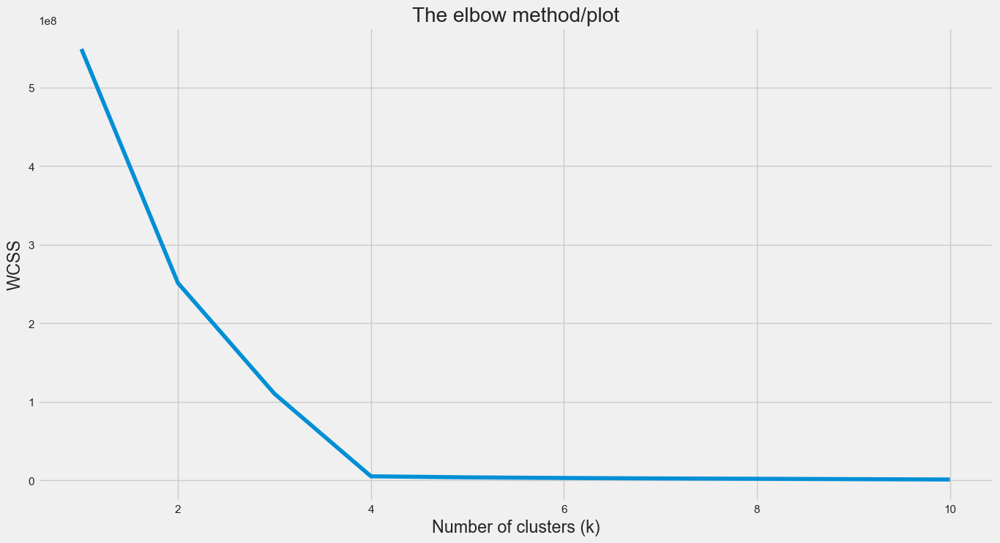

In [163]:
# WCSS - Plot the elbow plot - Choosing the Appropriate Number of Clusters
#The elbow method
wcss = []
kmeans_kwargs = {
    "init":"random",
    "n_init":10,
    "max_iter":300,
    "random_state":42,

}
for k in range(1,11):
    kmeans = KMeans(n_clusters = k, **kmeans_kwargs) # Python’s dictionary unpacking operator (**)
    kmeans.fit(df_clustering) # train the algorithm with the input data (x)
    wcss.append(kmeans.inertia_) # WCSS is also called inertia
# Plot the results on a line chart allow us to observe the elbow
plt.rcParams["figure.figsize"] = (15, 8)
plt.style.use("fivethirtyeight")
plt.plot(range(1,11), wcss)
plt.title('The elbow method/plot')
plt.xlabel('Number of clusters (k)')
plt.ylabel('WCSS')
plt.show()

In [164]:
# Determining the elbow point in the SSE curve isn’t always straightforward. If you’re having trouble choosing the elbow point of the curve, 
# then you could use a Python package, kneed, to identify the elbow point programmatically:
!pip install kneed
from kneed import DataGenerator, KneeLocator

x, y = DataGenerator.figure2()

print([round(i, 3) for i in x])
print([round(i, 3) for i in y])

[0.0, 0.111, 0.222, 0.333, 0.444, 0.556, 0.667, 0.778, 0.889, 1.0]
[-5.0, 0.263, 1.897, 2.692, 3.163, 3.475, 3.696, 3.861, 3.989, 4.091]


In [165]:
# The knee (or elbow) point is calculated simply by instantiating the KneeLocator class with x, y and the appropriate curve and direction. 
# Here, kneedle.knee and/or kneedle.elbow store the point of maximum curvature.
kneedle = KneeLocator(x, y, S=1.0, curve='concave', direction='increasing')

print(round(kneedle.knee, 3))
print(round(kneedle.elbow, 3))

0.222
0.222


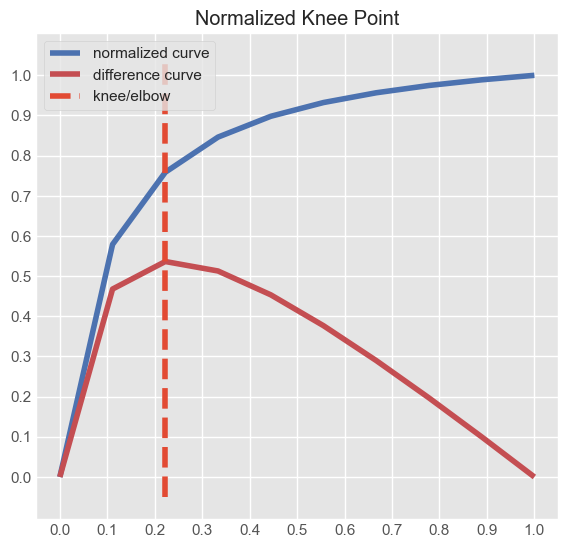

In [166]:
# Normalized data, normalized knee, and normalized distance curve.
plt.style.use('ggplot')
kneedle.plot_knee_normalized()

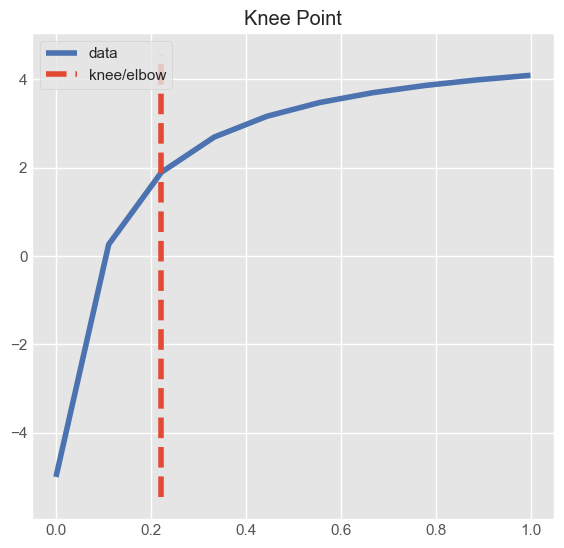

In [167]:
# Raw data and knee
kneedle.plot_knee()

In [168]:
#Silhouette coefficient values range between -1 and 1. Larger numbers indicate that samples are closer to their clusters than they are to other clusters.
# list holds the silhouette coefficients and davies_bouldin_score for each k
silhouette_coefficients = []
davies_bouldin_index = []
# Notice you start at 2 clusters for silhouette coefficient
for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(df_clustering)
    score = silhouette_score(df_clustering, kmeans.labels_)
    silhouette_coefficients.append(score)
    dbs = metrics.davies_bouldin_score(df_clustering, kmeans.labels_) 
    davies_bouldin_index.append(dbs)
print("KMeans silhouette_coefficients->", silhouette_coefficients)
print("KMeans davies_bouldin_scores->", davies_bouldin_index)

KMeans silhouette_coefficients-> [0.6072565734551953, 0.7558626560039525, 0.9172507844401985, 0.7686118161247599, 0.841523513901847, 0.7776960124710751, 0.8386742075595393, 0.805233241683115, 0.7616303541431085]
KMeans davies_bouldin_scores-> [0.8575035016270798, 0.527954034393263, 0.1307026418029349, 0.4384754275029564, 0.30781485399740516, 0.46747112001709795, 0.3176574123345705, 0.406831059321764, 0.46467016450511195]


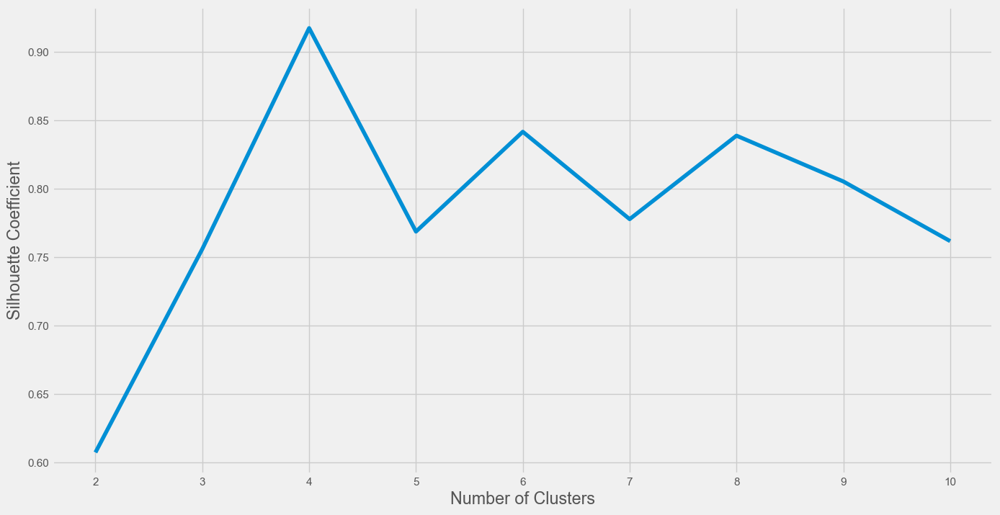

In [169]:
# Plotting the average silhouette scores for each k shows that the best choice for k is 3 since it has the maximum score:
plt.style.use("fivethirtyeight")
plt.plot(range(2, 11), silhouette_coefficients)
plt.xticks(range(2, 11))
plt.xlabel("Number of Clusters")
plt.ylabel("Silhouette Coefficient")
plt.show()

In [170]:
# We have decided on a k value = 3
kmeans = KMeans(n_clusters=3)
kmeans_model = kmeans.fit(df_clustering) # Training the model on input data

print(kmeans_model)

y_kmeans = kmeans_model.predict(df_clustering)
set(y_kmeans)

KMeans(n_clusters=3)


{0, 1, 2}

In [171]:
# Assign this label column as target class for each rows as shown
df_kmeans_clustering = df_clustering
df_kmeans_clustering['kmeans_class'] = kmeans_model.labels_
df_kmeans_clustering.head()

,gender,time_bp,time_dp,travel_time,easeof_online,home_env,prod_inc,sleep_bal,new_skill,fam_connect,...,occupation_Homemaker,occupation_Medical Professionals,occupation_Retired/Senior Citizen,occupation_Student in College,occupation_Student in School,occupation_Working Professional,prefer_Work/study from home,certaindays_hw_No,certaindays_hw_Yes,kmeans_class
0,1,7.5,5,0.5,3,3,0.0,0.0,0.5,1.0,...,0,0,0,1,0,0,0,0,1,2
1,1,7.5,11,0.5,4,2,-0.5,0.5,-1.0,1.0,...,0,0,0,0,1,0,0,1,0,0
2,1,8.5,7,1.5,2,2,1.0,0.0,0.5,0.5,...,0,0,0,1,0,0,0,0,1,1
3,1,8.5,7,1.5,3,1,0.0,1.0,0.5,0.0,...,0,0,0,1,0,0,0,0,1,2
4,0,8.5,7,1.5,2,2,0.0,0.0,0.0,0.0,...,0,0,0,1,0,0,0,0,1,0


## DBSCAN Clustering

In [173]:
# define the model
dbscan_model = DBSCAN(eps=0.3, min_samples=20)
dbscan_model

DBSCAN(eps=0.3, min_samples=20)

In [174]:
db  = dbscan_model.fit(df_clustering)

labels = db.labels_
print(len(set(labels)))

n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
print(n_clusters_)

n_noise_ = list(labels).count(-1)
print(n_noise_)

print('Estimated number of clusters: %d' % n_clusters_)
print('Estimated number of noise points: %d' % n_noise_)
print("Silhouette Coefficient: %0.3f" % metrics.silhouette_score(df_clustering, labels))
print("Davies-Bouldin Index: %0.3f"
      % metrics.davies_bouldin_score(df_clustering, labels))

16
15
647
Estimated number of clusters: 15
Estimated number of noise points: 647
Silhouette Coefficient: -0.076
Davies-Bouldin Index: 1.049


In [175]:
y_means = db.fit_predict(df_clustering)
set(y_means)

{-1, 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14}

In [176]:
from itertools import product

eps_values = np.arange(8,12.75,0.25) # eps values to be investigated
min_samples = np.arange(3,10) # min_samples values to be investigated

DBSCAN_params = list(product(eps_values, min_samples))

In [177]:
no_of_clusters = []
sil_score = []

for p in DBSCAN_params:
    DBS_clustering = DBSCAN(eps=p[0], min_samples=p[1]).fit(df_clustering)
    no_of_clusters.append(len(np.unique(DBS_clustering.labels_)))
    sil_score.append(silhouette_score(df_clustering, DBS_clustering.labels_))

A heatplot below shows how many clusters were generated by the DBSCAN algorithm for the respective parameters combinations

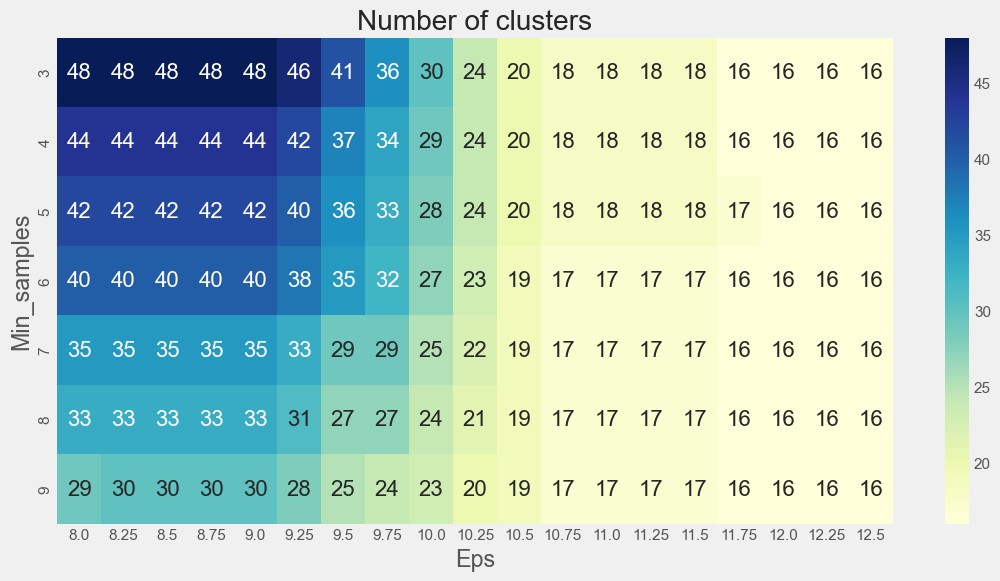

In [179]:
tmp = pd.DataFrame.from_records(DBSCAN_params, columns =['Eps', 'Min_samples'])   
tmp['No_of_clusters'] = no_of_clusters

pivot_1 = pd.pivot_table(tmp, values='No_of_clusters', index='Min_samples', columns='Eps')

fig, ax = plt.subplots(figsize=(12,6))
sns.heatmap(pivot_1, annot=True,annot_kws={"size": 16}, cmap="YlGnBu", ax=ax)
ax.set_title('Number of clusters')
plt.show()

The heatplot above shows, the number of clusters vary from 48 to 16. However, most of the combinations gives 16-17 clusters. To decide which combination to choose I will use a metric - a silhuette score and I will plot it as a heatmap again

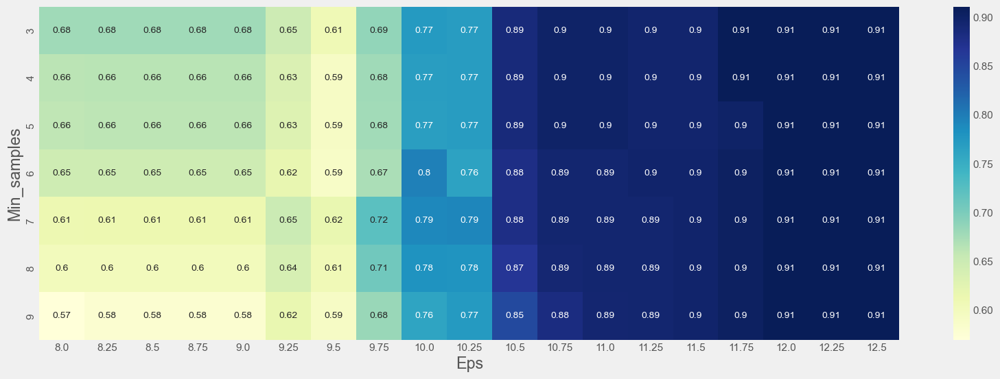

In [181]:
tmp = pd.DataFrame.from_records(DBSCAN_params, columns =['Eps', 'Min_samples'])   
tmp['Sil_score'] = sil_score

pivot_1 = pd.pivot_table(tmp, values='Sil_score', index='Min_samples', columns='Eps')

fig, ax = plt.subplots(figsize=(18,6))
sns.heatmap(pivot_1, annot=True, annot_kws={"size": 10}, cmap="YlGnBu", ax=ax)
plt.show()

Global maximum is 0.91 for eps=11.75 and min_samples=4.

In [183]:
DBS_clustering = DBSCAN(eps=11.75, min_samples=3).fit(df_clustering)

DBSCAN_clustered = df_clustering.copy()
DBSCAN_clustered.loc[:,'Cluster'] = DBS_clustering.labels_ # append labels to points

In [184]:
# Checking the size of clusters
DBSCAN_clust_sizes = DBSCAN_clustered.groupby('Cluster').size().to_frame()
DBSCAN_clust_sizes.columns = ["DBSCAN_size"]
DBSCAN_clust_sizes
# DBSCAN created 16 clusters plus outliers cluster (-1). Sizes of clusters 0-4 vary significantly 

,DBSCAN_size
Cluster,
0,98
1,190
2,145
3,100
4,114
5,29
6,78
7,45
8,21


# Agglomerative Clustering : hierarchical clustering

In [186]:
df_agg_clustering = df_clustering

agglomerative_model = AgglomerativeClustering(n_clusters=5)
agglomerative_model

AgglomerativeClustering(n_clusters=5)

In [187]:
agglomerative_result = agglomerative_model.fit_predict(df_agg_clustering)
print(agglomerative_result)

df_agg_clustering["Clusters"] = agglomerative_result

[1 0 2 ... 2 0 2]


In [188]:
agglomerative_clusters = len(np.unique(agglomerative_result))
print(agglomerative_clusters)

n_noise_ = list(agglomerative_result).count(-1)
print(n_noise_)

print('Estimated number of clusters: %d' % agglomerative_clusters)
print('Estimated number of noise points: %d' % n_noise_)
print("Silhouette Coefficient: %0.3f"
      % metrics.silhouette_score(df_agg_clustering, agglomerative_result))
print("Davies-Bouldin Index: %0.3f"
      % metrics.davies_bouldin_score(df_agg_clustering, agglomerative_result))

5
0
Estimated number of clusters: 5
Estimated number of noise points: 0
Silhouette Coefficient: 0.769
Davies-Bouldin Index: 0.438


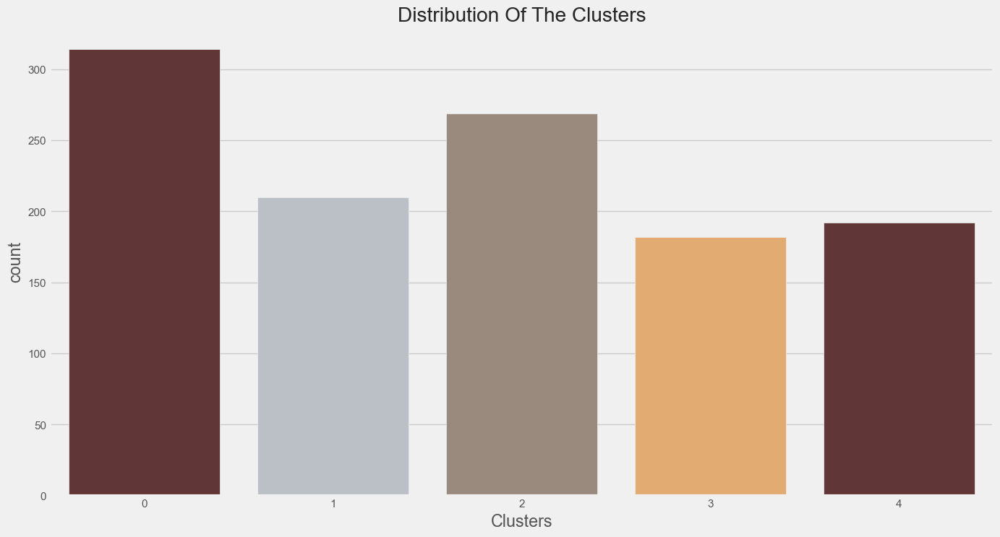

In [189]:
#Plotting countplot of clusters
pal = ["#682F2F","#B9C0C9", "#9F8A78","#F3AB60"]
pl = sns.countplot(x=df_agg_clustering["Clusters"], palette= pal)
pl.set_title("Distribution Of The Clusters")
plt.show()

The clusters seem to be fairly distributed.

# Mean-Shift Clustering

In [192]:
df_mean_shift_clustering = df_clustering

# The following bandwidth can be automatically detected using
bandwidth = estimate_bandwidth(X, quantile=0.2, n_samples=1000)

mean_model = MeanShift(bandwidth=bandwidth, bin_seeding=True)
mean_model

MeanShift(bandwidth=376.2475918466712, bin_seeding=True)

In [193]:
mean_result = mean_model.fit_predict(df_mean_shift_clustering)
print(mean_result)

df_mean_shift_clustering["Clusters"] = mean_result

mean_clusters = len(np.unique(agglomerative_result))
print(mean_clusters)

[2 0 1 ... 1 0 1]
5


In [194]:
n_noise_ = list(mean_result).count(-1)
print(n_noise_)

print('Estimated number of clusters: %d' % mean_clusters)
print('Estimated number of noise points: %d' % n_noise_)
print("Silhouette Coefficient: %0.3f"
      % metrics.silhouette_score(df_mean_shift_clustering, mean_result))
print("Davies-Bouldin Index: %0.3f"
      % metrics.davies_bouldin_score(df_mean_shift_clustering, mean_result))

0
Estimated number of clusters: 5
Estimated number of noise points: 0
Silhouette Coefficient: 0.917
Davies-Bouldin Index: 0.131


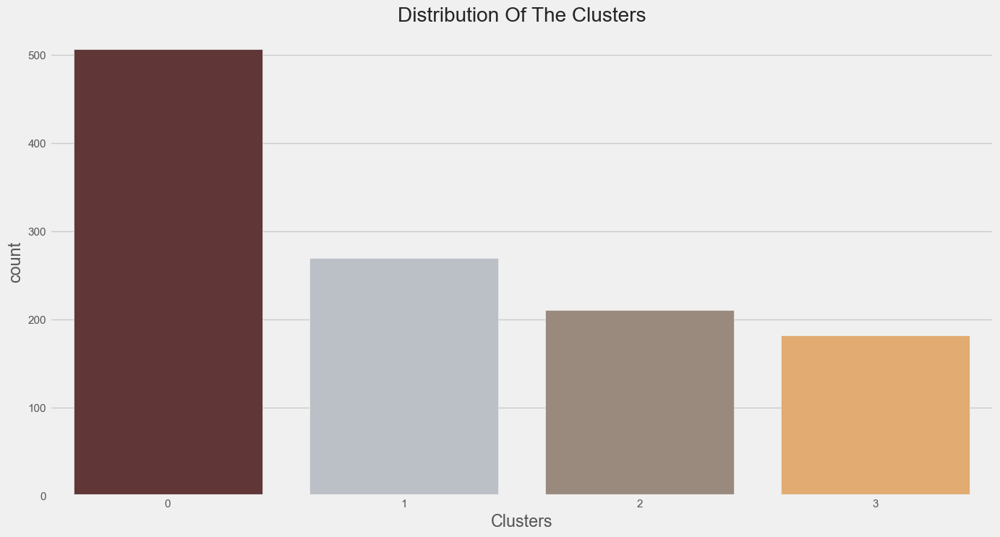

In [195]:
#Plotting countplot of clusters
pl = sns.countplot(x=df_mean_shift_clustering["Clusters"], palette= pal)
pl.set_title("Distribution Of The Clusters")
plt.show()	

# Explainable AI (XAI)

Explainable AI (XAI) is essential for understanding predictions related to workforce behaviour and preferences, ensuring that decisions based on these models are both reliable and justifiable. Tools like feature importance and coefficients in models such as Random Forest and Logistic Regression help identify which factors, like gender or age, most influence predictions, such as preferences for remote work.
Local interpretation tools like LIME and SHAP enhance trust and accountability by making individual predictions more understandable. For example, SHAP values clarify how different factors contribute to predictions in complex models like RandomForestRegressor.
Additionally, explainable methods aid in interpreting clusters by analysing centroids and silhouette scores, providing insights into workforce segmentation. These techniques are critical for uncovering the most influential features in classification models, enabling a deeper understanding of how input variables impact predictions and ultimately fostering trust in machine learning systems.

In this context, let's explore the different feature importance techniques used in classification models:


## a. Random Forest Classifer Feature Importance

In [199]:
random_forest_fi = rfc.feature_importances_

sorted_indices = np.argsort(random_forest_fi)[::-1]
 
feat_labels = X.columns[0:]
 
for f in range(X_train.shape[1]):
    print("%2d) %-*s %f" % (f + 1, 30,
                            feat_labels[sorted_indices[f]],
                            random_forest_fi[sorted_indices[f]]))

 1) time_dp                        0.143032
 2) time_bp                        0.125578
 3) age_40-50                      0.101707
 4) occupation_Student in College  0.084171
 5) dislike_hw                     0.082705
 6) like_hw                        0.066085
 7) relaxed                        0.058701
 8) prod_inc                       0.031772
 9) occupation_Homemaker           0.031161
10) prefer_Work/study from home    0.028270
11) easeof_online                  0.027625
12) age_50-60                      0.027216
13) home_env                       0.027195
14) sleep_bal                      0.024057
15) new_skill                      0.023305
16) age_19-25                      0.022635
17) occupation_Entrepreneur        0.020510
18) fam_connect                    0.016720
19) occupation_Working Professional 0.012353
20) self_time                      0.008674
21) certaindays_hw_Yes             0.007908
22) certaindays_hw_No              0.007506
23) travel_time                

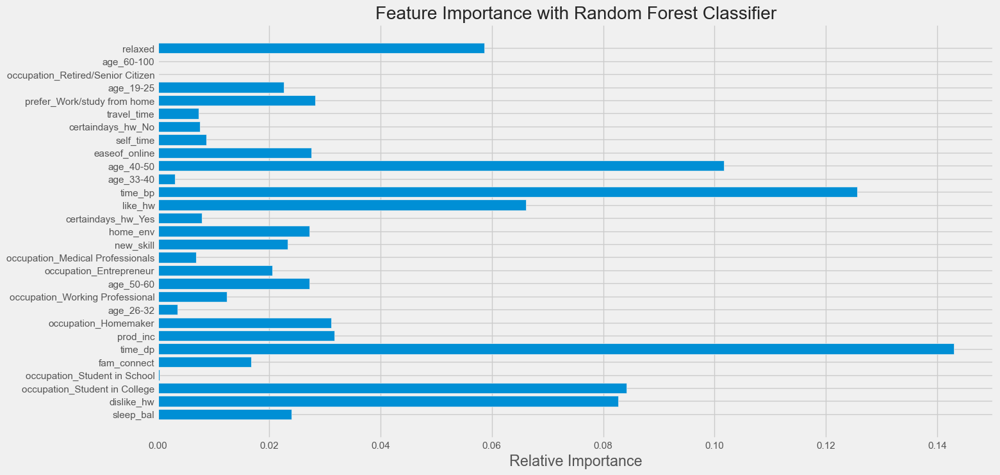

In [200]:
p# Plot Feature Importance
names = [X.columns[i] for i in random_forest_fi.argsort()]

plt.figure()
plt.title("Feature Importance with Random Forest Classifier")
plt.barh(sorted_indices, sorted(random_forest_fi), align='center')
plt.yticks(sorted_indices, names)
plt.xlabel('Relative Importance')
plt.show()

## b.Decision Tree Classifer Feature Importance

In [202]:
decision_tree_fi = dtc.feature_importances_

sorted_indices = np.argsort(decision_tree_fi)[::-1]
 
feat_labels = X.columns[0:]
 
for f in range(X_train.shape[1]):
    print("%2d) %-*s %f" % (f + 1, 30,
                            feat_labels[sorted_indices[f]],
                            decision_tree_fi[sorted_indices[f]]))

 1) time_bp                        0.155665
 2) occupation_Student in College  0.136781
 3) time_dp                        0.131239
 4) relaxed                        0.086691
 5) age_40-50                      0.078501
 6) prod_inc                       0.060356
 7) like_hw                        0.058435
 8) easeof_online                  0.050663
 9) home_env                       0.043542
10) occupation_Homemaker           0.039409
11) dislike_hw                     0.031565
12) age_26-32                      0.023632
13) new_skill                      0.022284
14) fam_connect                    0.018445
15) self_time                      0.016666
16) certaindays_hw_Yes             0.013224
17) age_19-25                      0.009565
18) occupation_Medical Professionals 0.007379
19) occupation_Student in School   0.005576
20) travel_time                    0.005400
21) sleep_bal                      0.002115
22) prefer_Work/study from home    0.002010
23) certaindays_hw_No         

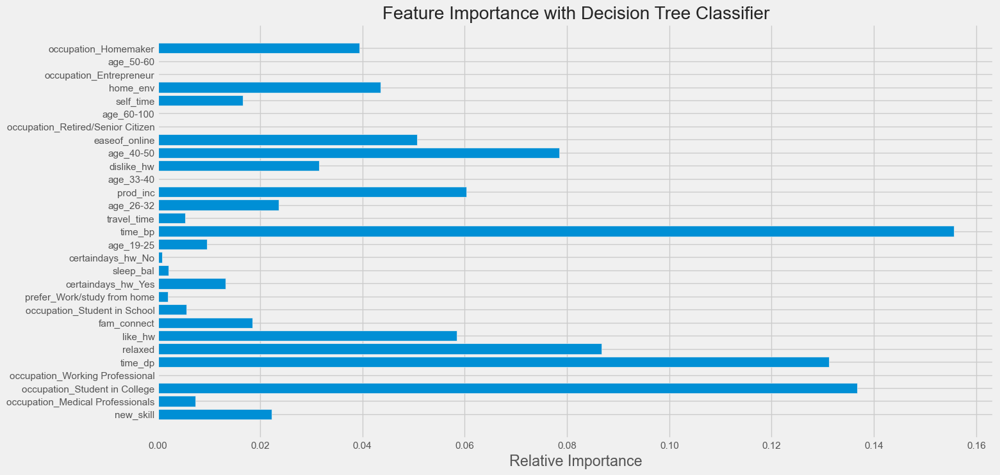

In [203]:
p# Plot Feature Importance
names = [X.columns[i] for i in decision_tree_fi.argsort()]

plt.figure()
plt.title("Feature Importance with Decision Tree Classifier")
plt.barh(sorted_indices, sorted(decision_tree_fi), align='center')
plt.yticks(sorted_indices, names)
plt.xlabel('Relative Importance')
plt.show()

# Saving Model for Sharing/deployment using Joblib (alternate via Pickle)

In [364]:
!pip install joblib
import joblib

# saving our model eg xgboost here as an example
filename = 'finalized_model.jlib'
joblib.dump(svc_classifier , filename)

['finalized_model.jlib']

In [365]:
# load the model from disk
loaded_model = joblib.load(filename)
result = loaded_model.score(X_test, y_test)
print(result)

0.9315068493150684
